In [3]:
import pandas as pd 
import numpy as np 
import seaborn as sns 
import sklearn.metrics as metric
import matplotlib.pyplot as plt 
from Plot import init_style, to_pgf
from collections import defaultdict
import matplotlib as mpl
from pathlib import Path

In [4]:
init_style()

In [5]:
mpl.use("tkagg")

# Single Random embeddings 

In [6]:
rand_emb = Path("../media2/base_line/random_embedding")
rand_emb.exists()

True

In [7]:
ftrain, fval, ftest = Path("train_stats.tsv"), Path("val_stats.tsv"), Path("test_stats.tsv")

In [8]:
train = pd.read_table(rand_emb.joinpath(ftrain), index_col=0)
val = pd.read_table(rand_emb.joinpath(fval), index_col=0)
test = pd.read_table(rand_emb.joinpath(ftest), index_col=0)

In [9]:
def add_headers(
    fig,
    *,
    row_headers=None,
    col_headers=None,
    row_pad=1,
    col_pad=5,
    rotate_row_headers=True,
    **text_kwargs
):
    # Based on https://stackoverflow.com/a/25814386

    axes = fig.get_axes()

    for ax in axes:
        sbs = ax.get_subplotspec()

        # Putting headers on cols
        if (col_headers is not None) and sbs.is_first_row():
            ax.annotate(
                col_headers[sbs.colspan.start],
                xy=(0.5, 1),
                xytext=(0, col_pad),
                xycoords="axes fraction",
                textcoords="offset points",
                ha="center",
                va="baseline",
                **text_kwargs,
            )

        # Putting headers on rows
        if (row_headers is not None) and sbs.is_first_col():
            ax.annotate(
                row_headers[sbs.rowspan.start],
                xy=(0, 0.5),
                xytext=(-ax.yaxis.labelpad - row_pad, 0),
                xycoords=ax.yaxis.label,
                textcoords="offset points",
                ha="right",
                va="center",
                rotation=rotate_row_headers * 90,
                **text_kwargs,
            )


def shaded_line(mean, std, color, ax, label):
    ax.plot(range(len(mean)), mean, '-', label=label, color=color)
    ax.fill_between(range(len(mean)), mean - std, mean + std, color=color, alpha=0.2)


def loss_plot(train, val):
    fig, axs = plt.subplots(4, 3, figsize=(3.54*3, 3.54*3), sharex=True, sharey=True)
    row_names = ["PN_1_1", "TF_TG_split", "TF_split", "TG_split"]
    col_names = ["EXP", "G2V", "GO"] 
    print(row_names)

    row_i = 0
    for i, (name, frame) in enumerate(train.groupby(["Dataset", "Model"])):
        j = i % 3
        if j == 0 and i > 0:
            row_i += 1 
        ax = axs[row_i, j]
        train_loss = frame.groupby("Epoch").Loss.mean().to_numpy()
        train_std = frame.groupby("Epoch").Loss.std().to_numpy()
        shaded_line(train_loss, train_std, "b", ax, "Train")

        val_frame = val.loc[(val["Dataset"] == name[0]) & (val["Model"] == name[1])]
        val_loss = val_frame.groupby("Epoch").Mean_loss.mean().to_numpy()
        val_std = val_frame.groupby("Epoch").Mean_loss.std().to_numpy()
        shaded_line(val_loss, val_std, "r", ax, "Val")
        # axs[row_i, j].set_title(name[0] + " " + name[1])

        print(row_i, j, name)
    add_headers(fig, row_headers=row_names, col_headers=col_names)
    fig.tight_layout(pad=4)
    fig.supxlabel("Epoch", fontsize=14)
    fig.supylabel("Loss (mean)", fontsize=14)
    

In [10]:
def acc_plot(val):
    fig, axs = plt.subplots(4, 3, figsize=(3.54*3, 3.54*3), sharex=True, sharey=True)
    row_names = ["PN_1_1", "TF_TG_split", "TF_split", "TG_split"]
    col_names = ["EXP", "G2V", "GO"] 
    print(row_names)

    row_i = 0
    for i, (name, frame) in enumerate(val.groupby(["Dataset", "Model"])):
        j = i % 3
        if j == 0 and i > 0:
            row_i += 1 
        ax = axs[row_i, j]
        val_mean = frame.groupby("Epoch").Accuracy.mean().to_numpy()
        val_std = frame.groupby("Epoch").Accuracy.std().to_numpy()
        shaded_line(val_mean, val_std, "g", ax, "Val")

        print(row_i, j, name)
    add_headers(fig, row_headers=row_names, col_headers=col_names)
    fig.tight_layout(pad=4)
    fig.supxlabel("Epoch", fontsize=14)
    fig.supylabel("Accuracy (mean)", fontsize=14)

['PN_1_1', 'TF_TG_split', 'TF_split', 'TG_split']
0 0 ('PN_1_1', 'EXP')
0 1 ('PN_1_1', 'G2V')
0 2 ('PN_1_1', 'GO')
1 0 ('TF_TG_split', 'EXP')
1 1 ('TF_TG_split', 'G2V')
1 2 ('TF_TG_split', 'GO')
2 0 ('TF_split', 'EXP')
2 1 ('TF_split', 'G2V')
2 2 ('TF_split', 'GO')
3 0 ('TG_split', 'EXP')
3 1 ('TG_split', 'G2V')
3 2 ('TG_split', 'GO')


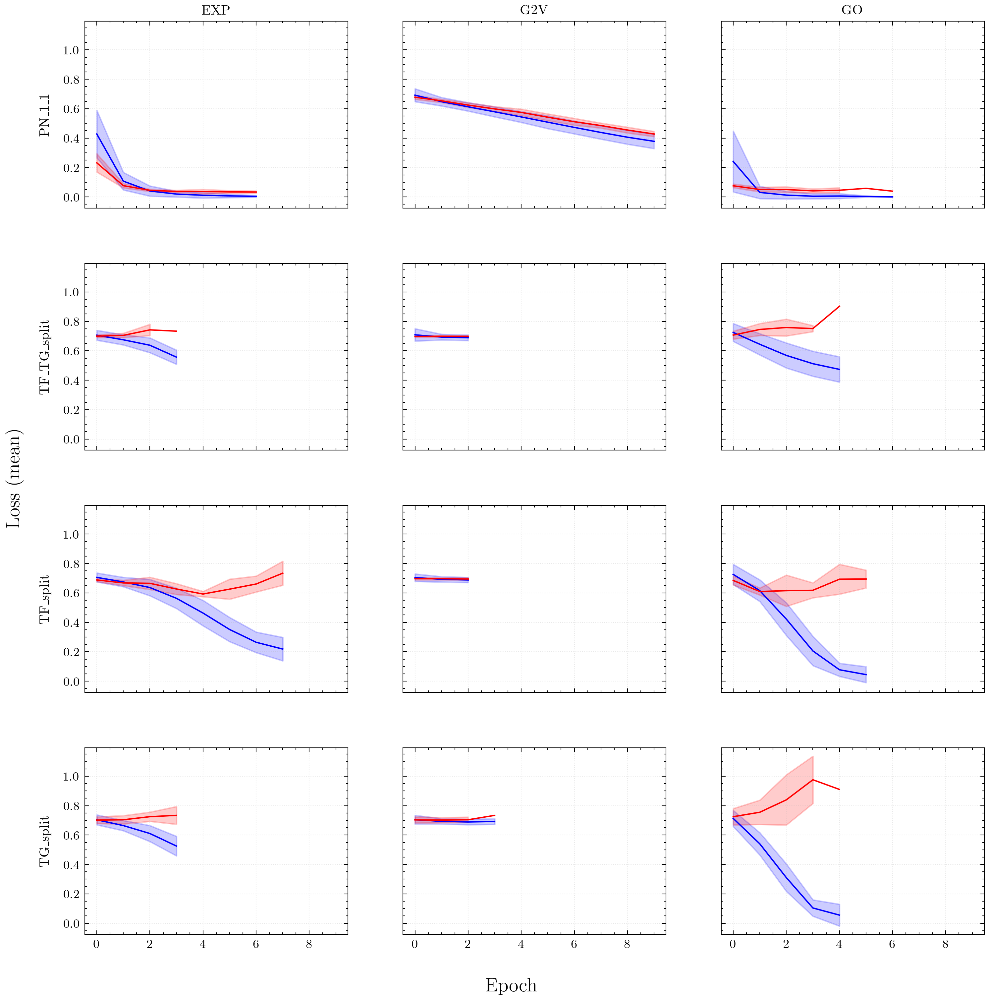

In [11]:
%matplotlib inline
loss_plot(train, val)
plt.savefig(rand_emb.joinpath("loss_plot.png"), dpi=400, bbox_inches="tight")


['PN_1_1', 'TF_TG_split', 'TF_split', 'TG_split']
0 0 ('PN_1_1', 'EXP')
0 1 ('PN_1_1', 'G2V')
0 2 ('PN_1_1', 'GO')
1 0 ('TF_TG_split', 'EXP')
1 1 ('TF_TG_split', 'G2V')
1 2 ('TF_TG_split', 'GO')
2 0 ('TF_split', 'EXP')
2 1 ('TF_split', 'G2V')
2 2 ('TF_split', 'GO')
3 0 ('TG_split', 'EXP')
3 1 ('TG_split', 'G2V')
3 2 ('TG_split', 'GO')


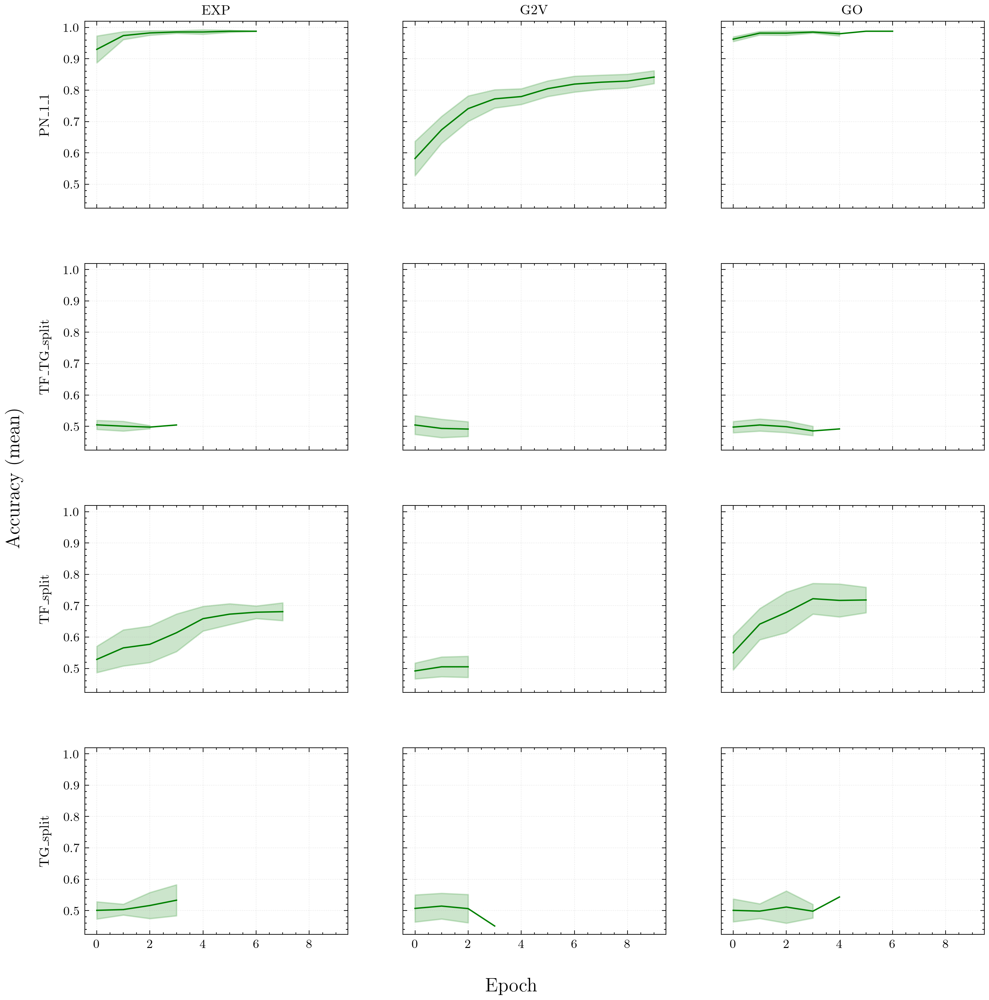

In [12]:
acc_plot(val)
plt.savefig(rand_emb.joinpath("accuracy.png"), dpi=400, bbox_inches="tight")

In [13]:
def auc_scores(test_df):
    roc_scores = defaultdict(list)
    prc_scores = defaultdict(list)

    for name, frame in test_df.groupby(["Dataset", "Model", "Run"]):
        name = name[:2]
        #frame["pred_label"] = (frame.Pred >= 0.5).astype(int)
        roc_scores[name].append(metric.roc_auc_score(frame.Label, frame.Pred))

        precision, recall, _ = metric.precision_recall_curve(frame.Label, frame.Pred)

        prc_scores[name].append(metric.auc(recall, precision))
    return roc_scores, prc_scores


In [14]:
roc, prc = auc_scores(test)
roc_df = pd.DataFrame.from_dict(roc).melt()
prc_df = pd.DataFrame.from_dict(prc).melt()


In [15]:
def grouped_bar(df):
  
    g = sns.catplot(
        data=df, kind="bar",
        x="variable_0", y="value", hue="variable_1",
        errorbar="se", palette="dark", alpha=.6,
        facet_kws={"despine": False}, order=["PN_1_1", "TF_split", "TG_split", "TF_TG_split"],
        capsize=.2
    )
    plt.axhline(y = 0.5, color = 'r', linestyle = '-.', alpha=0.8) 
    plt.ylim(0, 1.05)

    g.set_xlabels("Dataset")
    g.set_ylabels("Mean AUROC")
    g._legend.set_title("Model")
    

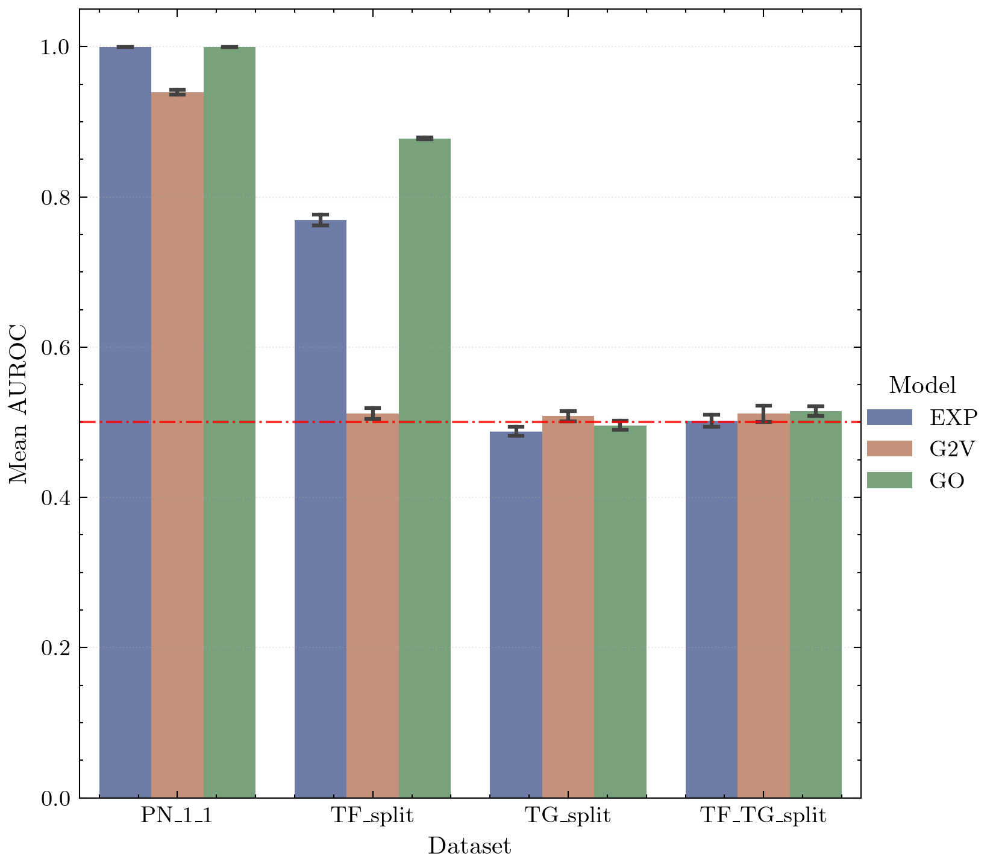

In [16]:
grouped_bar(prc_df)
plt.savefig(rand_emb.joinpath("mean_AUROC.png"), dpi=400, bbox_inches="tight")

In [17]:
df = test

def performance_report(df):
    data_array = []
    index1, index2 = [], []
    col_names = ["Precision", "Recall", "F1-score", "Accuracy"]

    for name, frame in df.groupby(["Dataset", "Model"]): 
        index1.append(name[0])
        index2.append(name[1])
        lab = frame.Label 
        prob = frame.Pred
        pred_lab = (prob >= 0.5).astype(int)
        report = pd.DataFrame.from_dict(metric.classification_report(lab, pred_lab, output_dict=True))
        metrics = report.iloc[:3, 1].to_list()
        metrics += [report["accuracy"].unique().item()]
        data_array.append(metrics)

    metric_report = pd.DataFrame(data_array, index=[index1, index2], columns=col_names)
    metric_report = metric_report.loc[["PN_1_1", "TF_split", "TG_split", "TF_TG_split"]]
    return metric_report


In [18]:
performance_report(test)

Precision    Recall  F1-score  Accuracy
PN_1_1      EXP   0.986075  0.998433  0.992216  0.992718
            G2V   0.870407  0.915405  0.892339  0.897330
            GO    0.987322  0.996345  0.991813  0.992354
TF_split    EXP   0.676790  0.603871  0.638254  0.657742
            G2V   0.501079  0.524194  0.512376  0.501129
            GO    0.738701  0.748710  0.743672  0.741935
TG_split    EXP   0.485262  0.347950  0.405291  0.489432
            G2V   0.505199  0.597792  0.547609  0.506151
            GO    0.503321  0.334700  0.402046  0.502208
TF_TG_split EXP   0.498134  0.673109  0.572552  0.497479
            G2V   0.491109  0.487395  0.489245  0.491176
            GO    0.500339  0.620168  0.553846  0.500420

# shuffled labels

In [19]:
shuff_lab = Path("../media2/base_line/label_shuffle")
shuff_lab.exists()

True

In [20]:
train = pd.read_table(shuff_lab.joinpath(ftrain), index_col=0)
val = pd.read_table(shuff_lab.joinpath(fval), index_col=0)
test = pd.read_table(shuff_lab.joinpath(ftest), index_col=0)

['PN_1_1', 'TF_TG_split', 'TF_split', 'TG_split']
0 0 ('PN_1_1', 'EXP')
0 1 ('PN_1_1', 'G2V')
0 2 ('PN_1_1', 'GO')
1 0 ('TF_TG_split', 'EXP')
1 1 ('TF_TG_split', 'G2V')
1 2 ('TF_TG_split', 'GO')
2 0 ('TF_split', 'EXP')
2 1 ('TF_split', 'G2V')
2 2 ('TF_split', 'GO')
3 0 ('TG_split', 'EXP')
3 1 ('TG_split', 'G2V')
3 2 ('TG_split', 'GO')


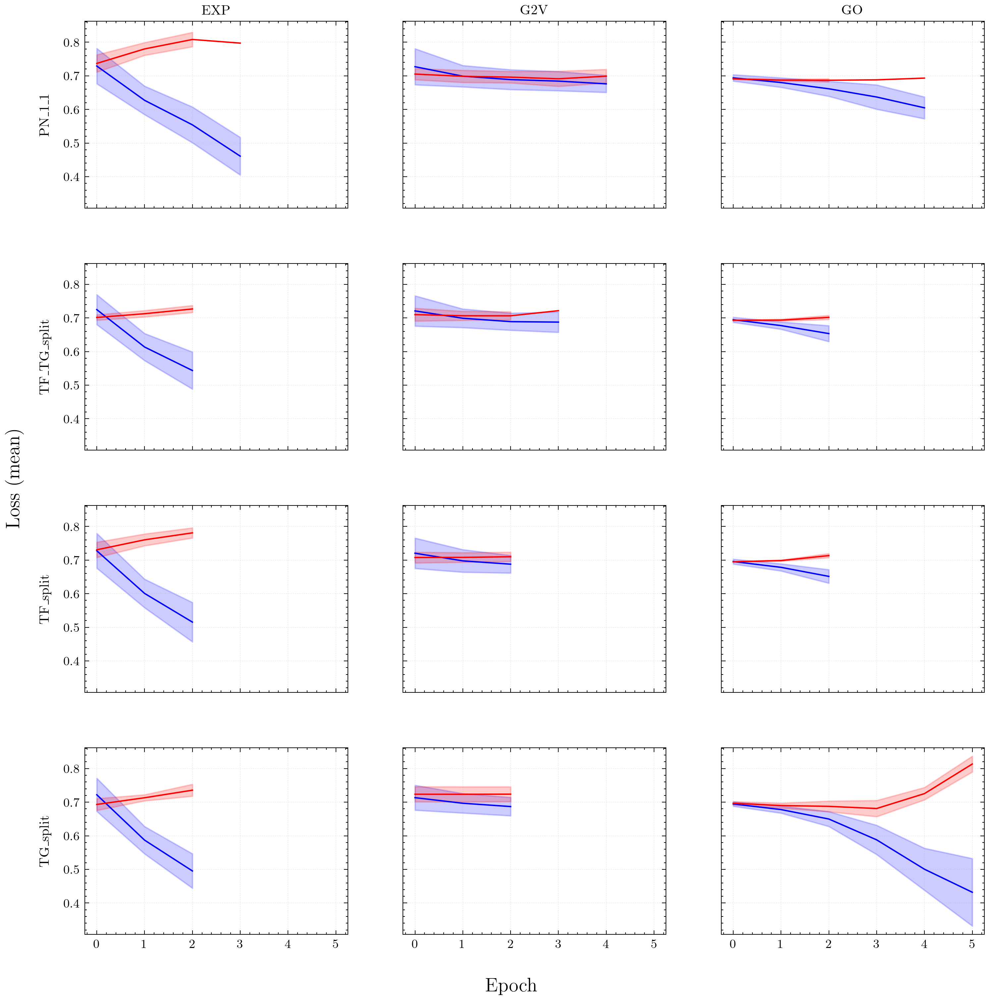

In [21]:
loss_plot(train, val)
plt.savefig(shuff_lab.joinpath("loss_plot.png"), dpi=400, bbox_inches="tight")

['PN_1_1', 'TF_TG_split', 'TF_split', 'TG_split']
0 0 ('PN_1_1', 'EXP')
0 1 ('PN_1_1', 'G2V')
0 2 ('PN_1_1', 'GO')
1 0 ('TF_TG_split', 'EXP')
1 1 ('TF_TG_split', 'G2V')
1 2 ('TF_TG_split', 'GO')
2 0 ('TF_split', 'EXP')
2 1 ('TF_split', 'G2V')
2 2 ('TF_split', 'GO')
3 0 ('TG_split', 'EXP')
3 1 ('TG_split', 'G2V')
3 2 ('TG_split', 'GO')


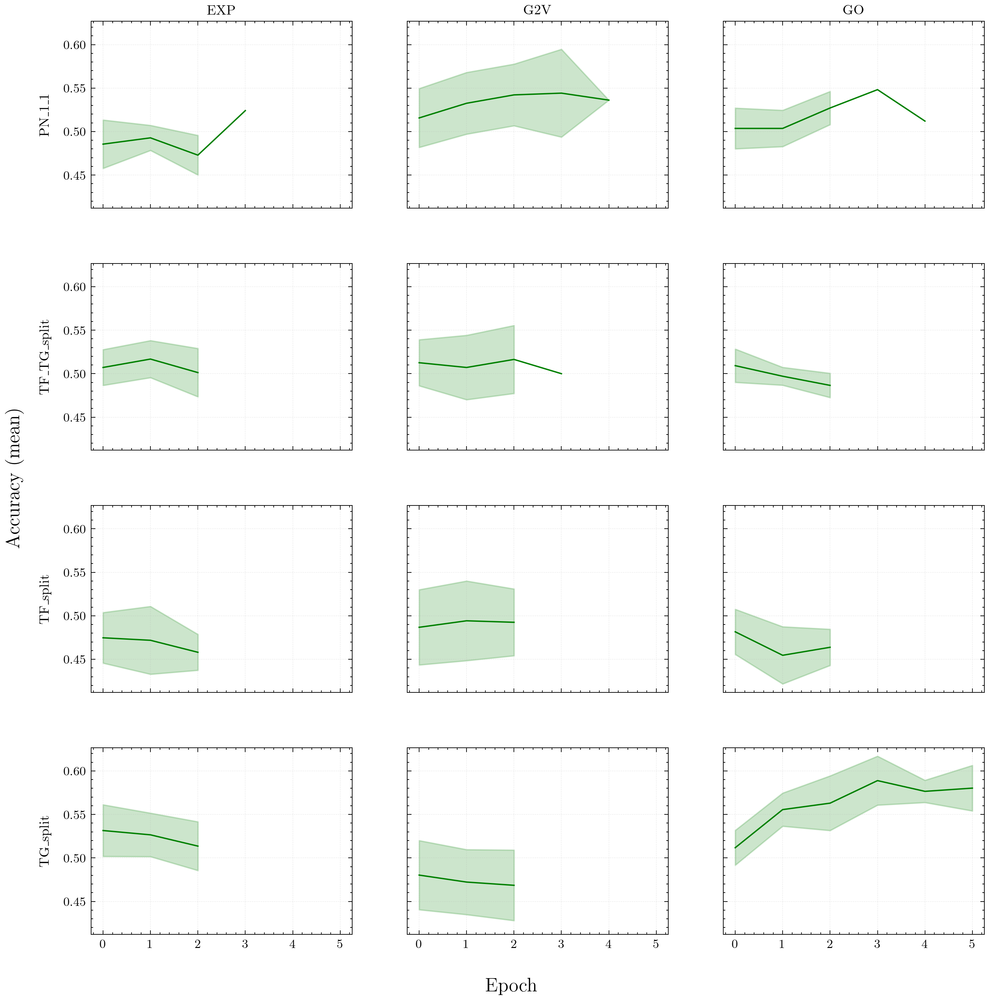

In [22]:
acc_plot(val)
plt.savefig(shuff_lab.joinpath("accuracy.png"), dpi=400, bbox_inches="tight")

In [23]:
roc, prc = auc_scores(test)
roc_df = pd.DataFrame.from_dict(roc).melt()
prc_df = pd.DataFrame.from_dict(prc).melt()


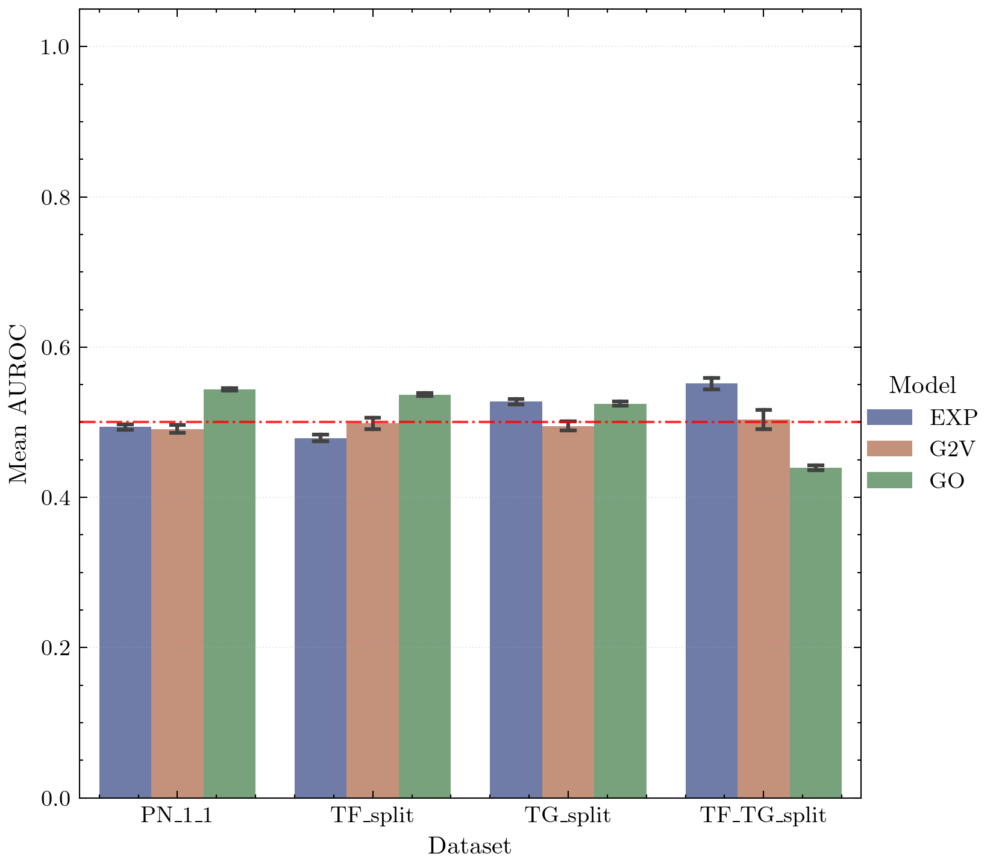

In [24]:
grouped_bar(roc_df)
plt.savefig(shuff_lab.joinpath("mean_AUROC.png"), dpi=400, bbox_inches="tight")

In [25]:
performance_report(test)

Precision    Recall  F1-score  Accuracy
PN_1_1      EXP   0.460552  0.553264  0.502669  0.491141
            G2V   0.462372  0.590339  0.518578  0.490534
            GO    0.494388  0.690078  0.576068  0.527913
TF_split    EXP   0.480516  0.552903  0.514174  0.477581
            G2V   0.492917  0.493871  0.493393  0.492903
            GO    0.524630  0.491290  0.507413  0.523065
TG_split    EXP   0.511806  0.547003  0.528820  0.512618
            G2V   0.495083  0.555836  0.523703  0.494479
            GO    0.514748  0.561514  0.537115  0.516088
TF_TG_split EXP   0.539406  0.442857  0.486387  0.532353
            G2V   0.504610  0.505882  0.505245  0.504622
            GO    0.463147  0.390756  0.423883  0.468908

# Single Random Embedding (g2v 3 layer encoder)

In [32]:
g2v_1000 = Path("/home/llan/Desktop/WUR/thesis2/media2/base_line/g2v_100")
train = pd.read_table(g2v_1000.joinpath(ftrain), index_col=0)
val = pd.read_table(g2v_1000.joinpath(fval), index_col=0)
test = pd.read_table(g2v_1000.joinpath(ftest), index_col=0)

['PN_1_1', 'TF_TG_split', 'TF_split', 'TG_split']
0 0 ('PN_1_1', 'EXP')
0 1 ('PN_1_1', 'G2V')
0 2 ('PN_1_1', 'GO')
1 0 ('TF_TG_split', 'EXP')
1 1 ('TF_TG_split', 'G2V')
1 2 ('TF_TG_split', 'GO')
2 0 ('TF_split', 'EXP')
2 1 ('TF_split', 'G2V')
2 2 ('TF_split', 'GO')
3 0 ('TG_split', 'EXP')
3 1 ('TG_split', 'G2V')
3 2 ('TG_split', 'GO')


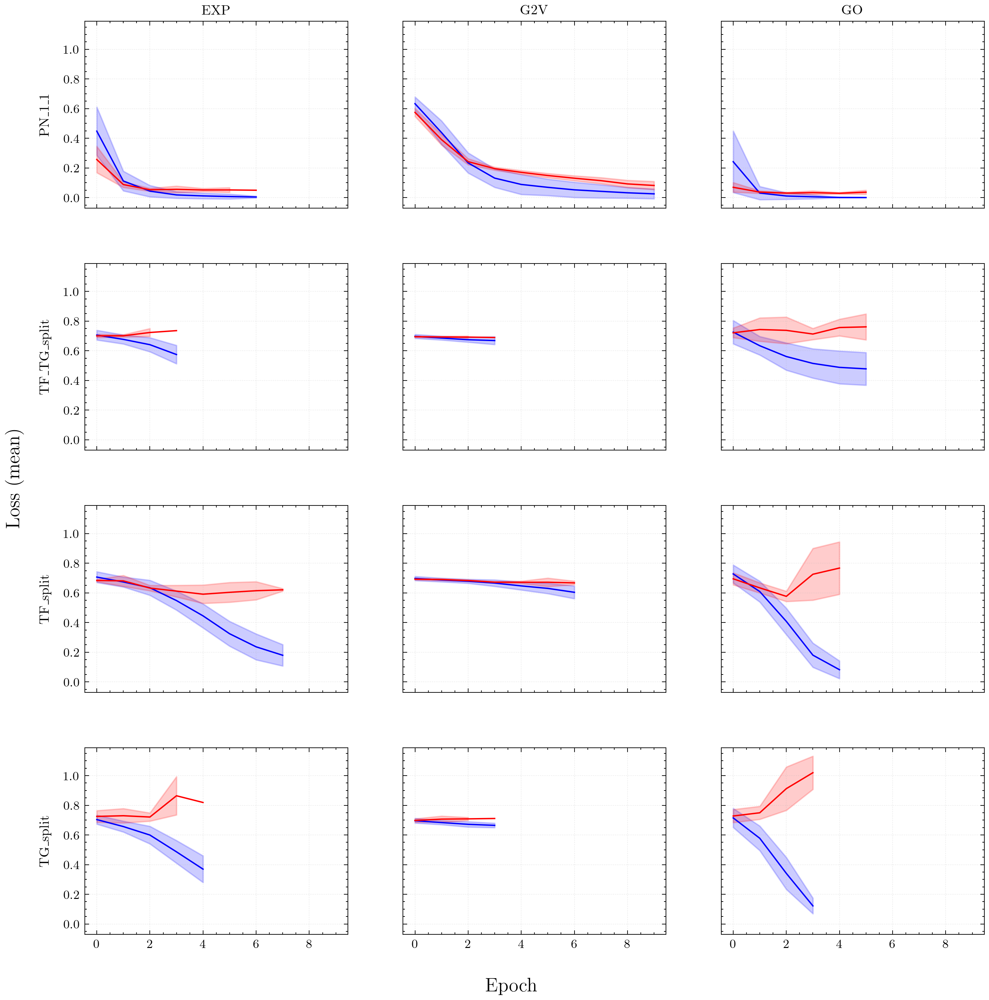

In [33]:
loss_plot(train, val)

['PN_1_1', 'TF_TG_split', 'TF_split', 'TG_split']
0 0 ('PN_1_1', 'EXP')
0 1 ('PN_1_1', 'G2V')
0 2 ('PN_1_1', 'GO')
1 0 ('TF_TG_split', 'EXP')
1 1 ('TF_TG_split', 'G2V')
1 2 ('TF_TG_split', 'GO')
2 0 ('TF_split', 'EXP')
2 1 ('TF_split', 'G2V')
2 2 ('TF_split', 'GO')
3 0 ('TG_split', 'EXP')
3 1 ('TG_split', 'G2V')
3 2 ('TG_split', 'GO')


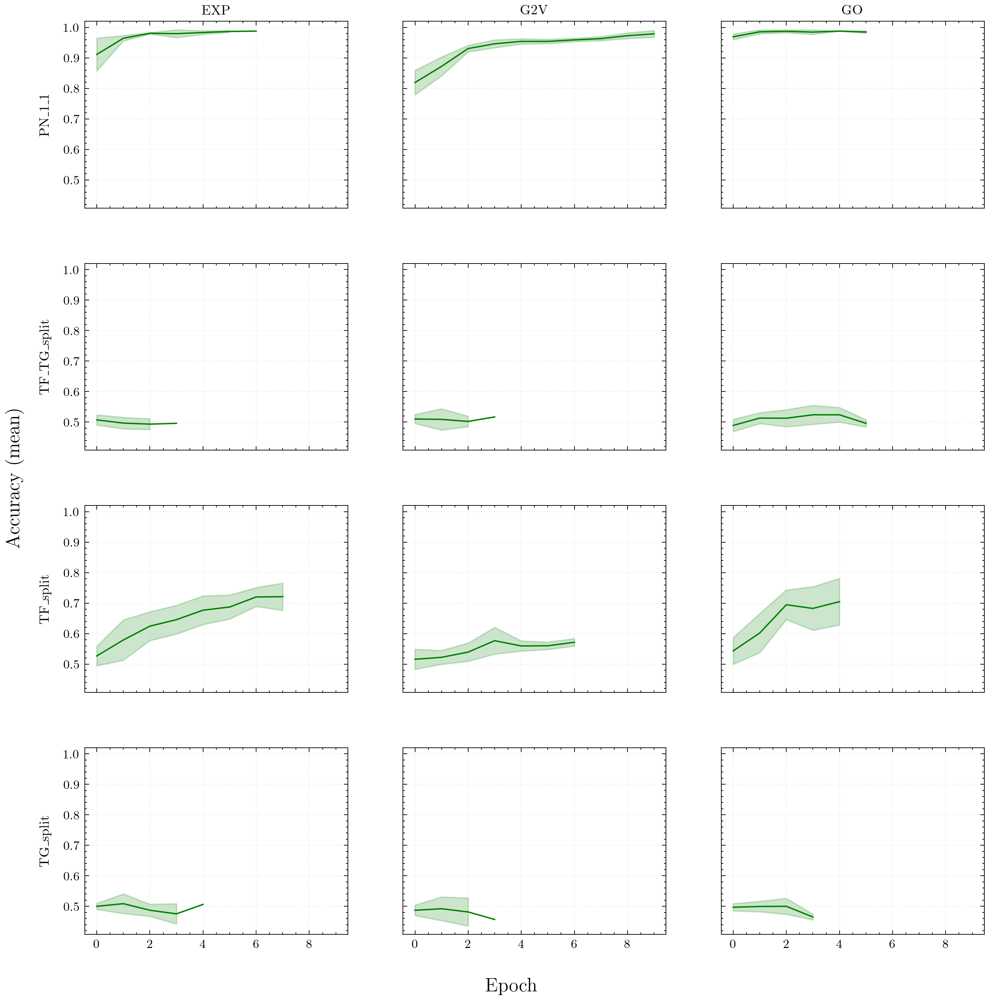

In [34]:
acc_plot(val)

In [35]:
roc, prc = auc_scores(test)
roc_df = pd.DataFrame(roc).melt()
prc_df = pd.DataFrame(prc).melt()

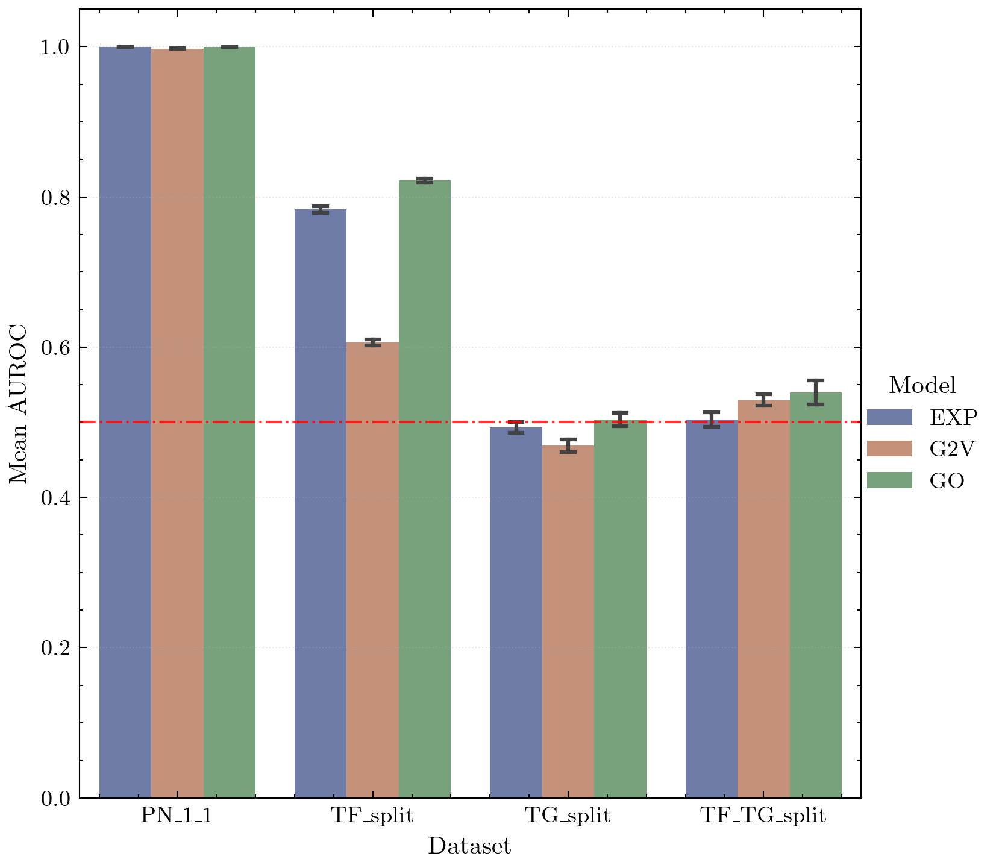

In [36]:
grouped_bar(roc_df)

In [37]:
performance_report(test)

Precision    Recall  F1-score  Accuracy
PN_1_1      EXP   0.986079  0.998695  0.992347  0.992840
            G2V   0.979344  0.990339  0.984811  0.985801
            GO    0.986822  0.997128  0.991948  0.992476
TF_split    EXP   0.706364  0.723226  0.714696  0.711290
            G2V   0.546780  0.665484  0.600320  0.556935
            GO    0.736242  0.729355  0.732782  0.734032
TG_split    EXP   0.502564  0.185489  0.270968  0.500946
            G2V   0.483085  0.531546  0.506158  0.481388
            GO    0.488658  0.237855  0.319966  0.494479
TF_TG_split EXP   0.496261  0.613445  0.548666  0.495378
            G2V   0.504983  0.383193  0.435738  0.503782
            GO    0.505245  0.728571  0.596696  0.507563

# single embedding

In [246]:
train = pd.read_table("../media2/binary/single_embedding/train_stats.tsv", index_col=0)
val = pd.read_table("../media2/binary/single_embedding/val_stats.tsv", index_col=0)
test = pd.read_table("../media2/binary/single_embedding/test_stats.tsv", index_col=0)

In [247]:
single = Path("../media2/binary/single_embedding")

['PN_1_1', 'TF_TG_split', 'TF_split', 'TG_split']
0 0 ('PN_1_1', 'EXP')
0 1 ('PN_1_1', 'G2V')
0 2 ('PN_1_1', 'GO')
1 0 ('TF_TG_split', 'EXP')
1 1 ('TF_TG_split', 'G2V')
1 2 ('TF_TG_split', 'GO')
2 0 ('TF_split', 'EXP')
2 1 ('TF_split', 'G2V')
2 2 ('TF_split', 'GO')
3 0 ('TG_split', 'EXP')
3 1 ('TG_split', 'G2V')
3 2 ('TG_split', 'GO')


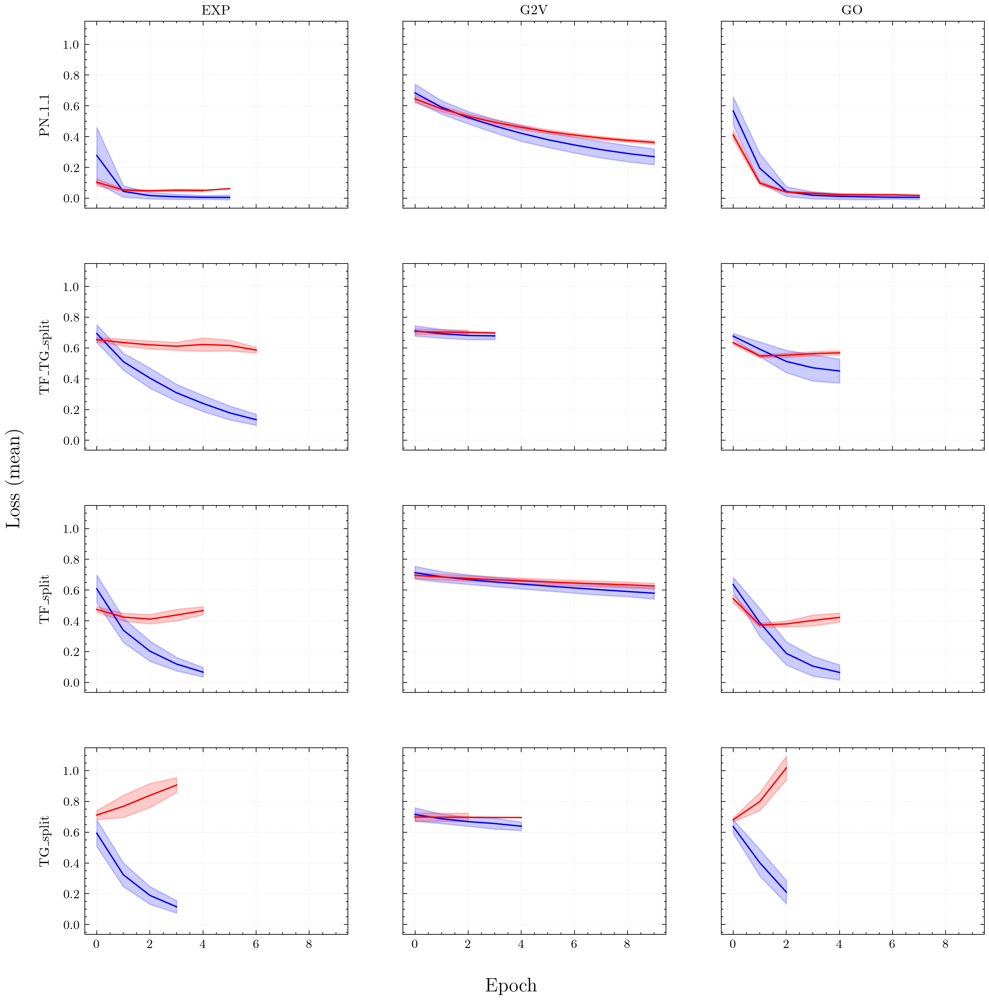

In [248]:
loss_plot(train, val)
plt.savefig(single.joinpath("loss_plot.png"), dpi=400, bbox_inches="tight")


['PN_1_1', 'TF_TG_split', 'TF_split', 'TG_split']
0 0 ('PN_1_1', 'EXP')
0 1 ('PN_1_1', 'G2V')
0 2 ('PN_1_1', 'GO')
1 0 ('TF_TG_split', 'EXP')
1 1 ('TF_TG_split', 'G2V')
1 2 ('TF_TG_split', 'GO')
2 0 ('TF_split', 'EXP')
2 1 ('TF_split', 'G2V')
2 2 ('TF_split', 'GO')
3 0 ('TG_split', 'EXP')
3 1 ('TG_split', 'G2V')
3 2 ('TG_split', 'GO')


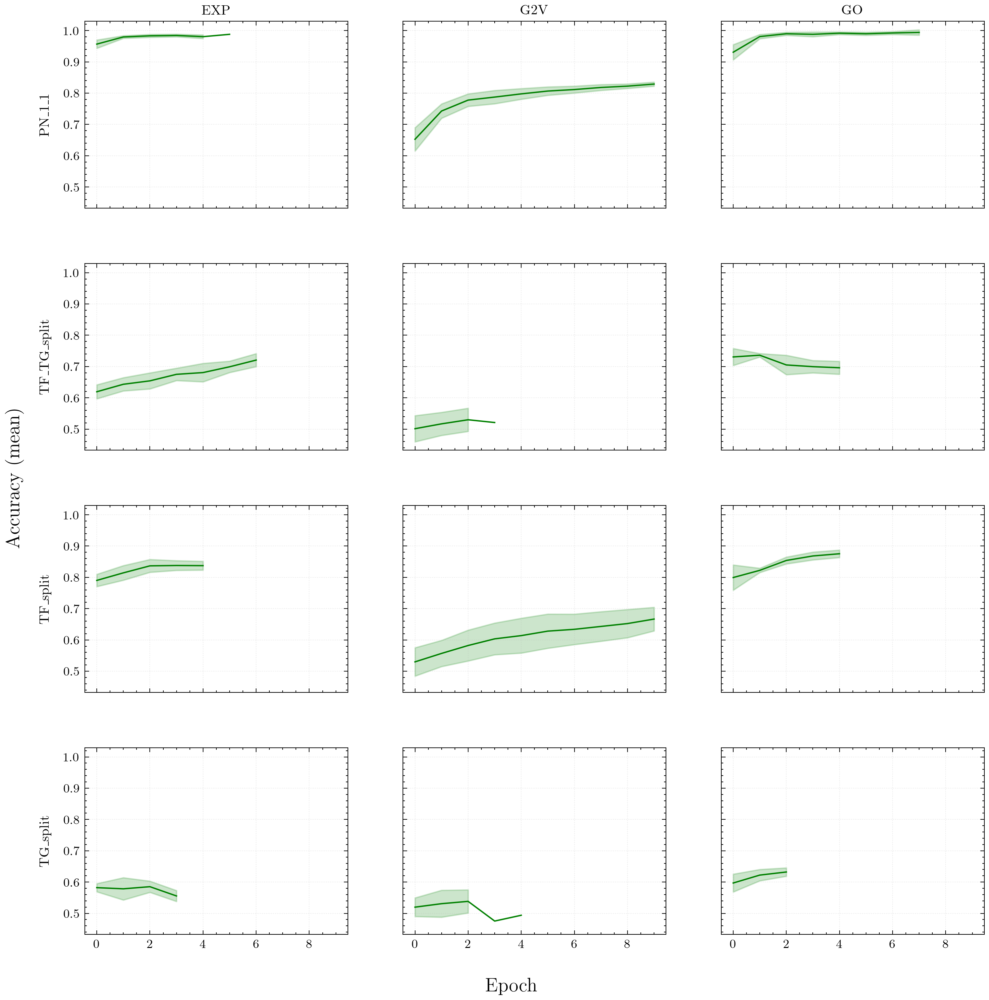

In [249]:
acc_plot(val)
plt.savefig(single.joinpath("accuracy.png"), dpi=400, bbox_inches="tight")

In [250]:
roc, prc = auc_scores(test)
roc_df = pd.DataFrame.from_dict(roc).melt()
prc_df = pd.DataFrame.from_dict(prc).melt()

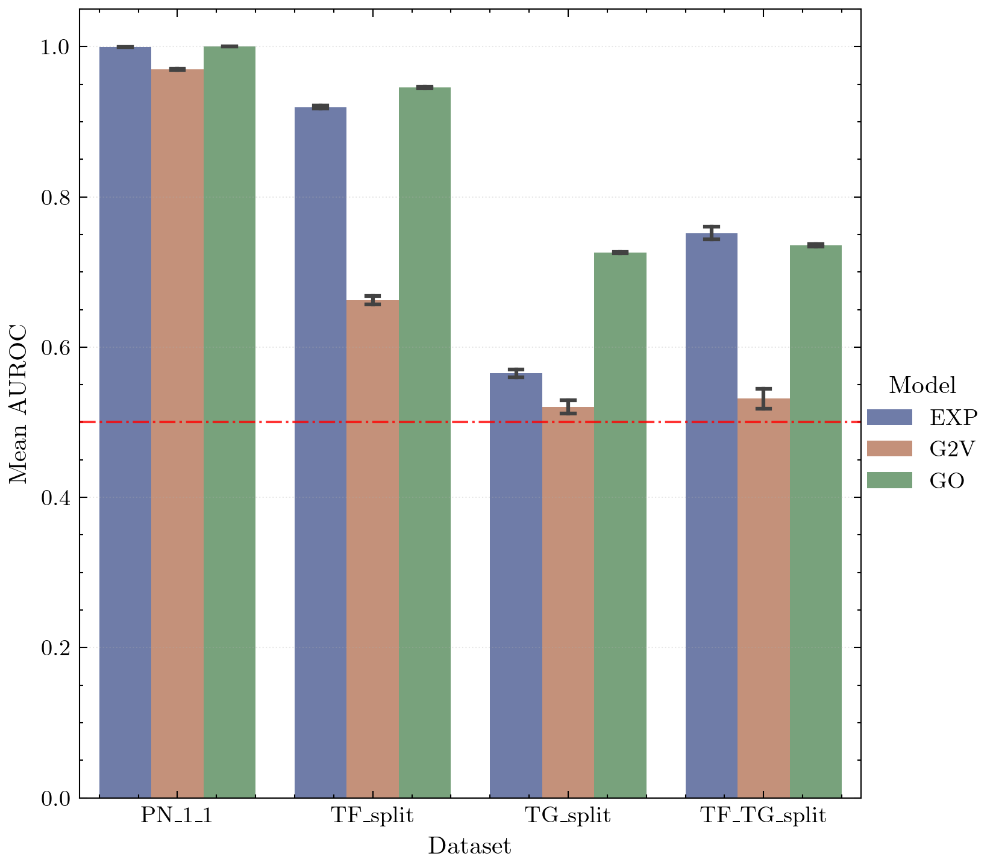

In [251]:
grouped_bar(roc_df)
plt.savefig(single.joinpath("mean_AUROC.png"), dpi=400, bbox_inches="tight")

In [252]:
performance_report(test)

Precision    Recall  F1-score  Accuracy
PN_1_1      EXP   0.991146  0.993734  0.992438  0.992961
            G2V   0.851920  0.961358  0.903337  0.904369
            GO    0.997627  0.987728  0.992653  0.993204
TF_split    EXP   0.844373  0.847097  0.845733  0.845484
            G2V   0.618250  0.583548  0.600398  0.611613
            GO    0.865780  0.882258  0.873942  0.872742
TG_split    EXP   0.541499  0.679180  0.602575  0.552050
            G2V   0.507481  0.524290  0.515749  0.507729
            GO    0.573002  0.836909  0.680256  0.606625
TF_TG_split EXP   0.673155  0.697479  0.685101  0.679412
            G2V   0.531602  0.515966  0.523667  0.530672
            GO    0.729228  0.626891  0.674198  0.697059

# Random double embedding (Addition)

In [315]:
def loss_plot(train, val, col_names):
    fig, axs = plt.subplots(4,3, figsize=(3.54*3, 3.54*3), sharex=True, sharey=True)
    row_names = ["PN_1_1", "TF_TG_split", "TF_split", "TG_split"]
    print(row_names)

    row_i = 0
    for i, (name, frame) in enumerate(train.groupby(["Dataset", "Model"])):
        j = i % 3
        if j == 0 and i > 0:
            row_i += 1 
        ax = axs[row_i, j]
        train_loss = frame.groupby("Epoch").Loss.mean().to_numpy()
        train_std = frame.groupby("Epoch").Loss.std().to_numpy()
        shaded_line(train_loss, train_std, "b", ax, "Train")

        val_frame = val.loc[(val["Dataset"] == name[0]) & (val["Model"] == name[1])]
        val_loss = val_frame.groupby("Epoch").Mean_loss.mean().to_numpy()
        val_std = val_frame.groupby("Epoch").Mean_loss.std().to_numpy()
        shaded_line(val_loss, val_std, "r", ax, "Val")
        # axs[row_i, j].set_title(name[0] + " " + name[1])

        print(row_i, j, name)
    add_headers(fig, row_headers=row_names, col_headers=col_names)
    fig.tight_layout(pad=4)
    fig.supxlabel("Epoch", fontsize=14)
    fig.supylabel("Loss (mean)", fontsize=14)

def acc_plot(val, col_names):
    fig, axs = plt.subplots(4,3, figsize=(3.54*3, 3.54*3), sharex=True, sharey=True)
    row_names = ["PN_1_1", "TF_TG_split", "TF_split", "TG_split"]
    print(row_names)

    row_i = 0
    for i, (name, frame) in enumerate(val.groupby(["Dataset", "Model"])):
        j = i % 3
        if j == 0 and i > 0:
            row_i += 1 
        ax = axs[row_i, j]
        val_mean = frame.groupby("Epoch").Accuracy.mean().to_numpy()
        val_std = frame.groupby("Epoch").Accuracy.std().to_numpy()
        shaded_line(val_mean, val_std, "g", ax, "Val")

        print(row_i, j, name)
    add_headers(fig, row_headers=row_names, col_headers=col_names)
    fig.tight_layout(pad=4)
    fig.supxlabel("Epoch", fontsize=14)
    fig.supylabel("Loss (mean)", fontsize=14)

In [316]:
db_rand = Path("../media2/binary/double_embedding/random_embedding_add")

In [317]:
train = pd.read_table(db_rand.joinpath(ftrain), index_col=0)
val = pd.read_table(db_rand.joinpath(fval), index_col=0)
test = pd.read_table(db_rand.joinpath(ftest), index_col=0)

['PN_1_1', 'TF_TG_split', 'TF_split', 'TG_split']
0 0 ('PN_1_1', 'EXPG2V')
0 1 ('PN_1_1', 'GOEXP')
0 2 ('PN_1_1', 'GOG2V')
1 0 ('TF_TG_split', 'EXPG2V')
1 1 ('TF_TG_split', 'GOEXP')
1 2 ('TF_TG_split', 'GOG2V')
2 0 ('TF_split', 'EXPG2V')
2 1 ('TF_split', 'GOEXP')
2 2 ('TF_split', 'GOG2V')
3 0 ('TG_split', 'EXPG2V')
3 1 ('TG_split', 'GOEXP')
3 2 ('TG_split', 'GOG2V')


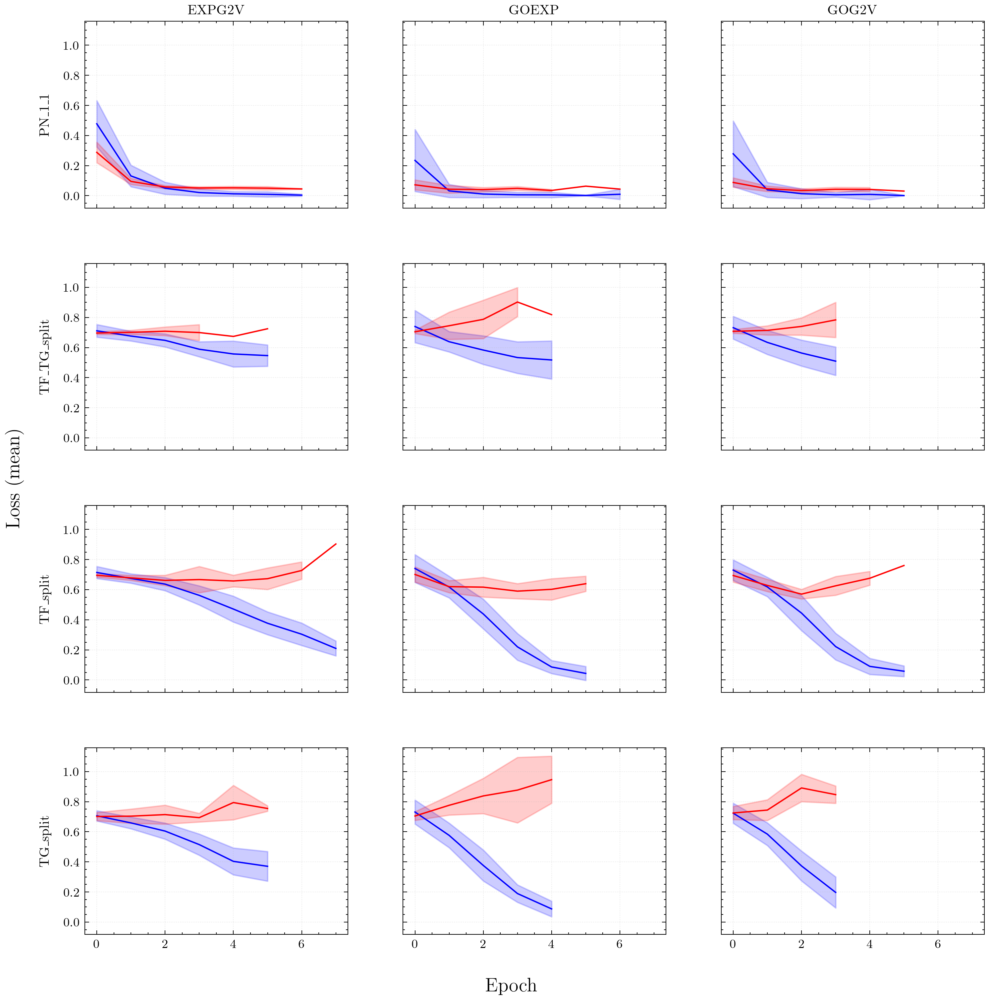

In [318]:
loss_plot(train, val, ["EXPG2V", "GOEXP", "GOG2V"])
plt.savefig(db_rand.joinpath("loss_plot.png"), dpi=400, bbox_inches="tight")

['PN_1_1', 'TF_TG_split', 'TF_split', 'TG_split']
0 0 ('PN_1_1', 'EXPG2V')
0 1 ('PN_1_1', 'GOEXP')
0 2 ('PN_1_1', 'GOG2V')
1 0 ('TF_TG_split', 'EXPG2V')
1 1 ('TF_TG_split', 'GOEXP')
1 2 ('TF_TG_split', 'GOG2V')
2 0 ('TF_split', 'EXPG2V')
2 1 ('TF_split', 'GOEXP')
2 2 ('TF_split', 'GOG2V')
3 0 ('TG_split', 'EXPG2V')
3 1 ('TG_split', 'GOEXP')
3 2 ('TG_split', 'GOG2V')


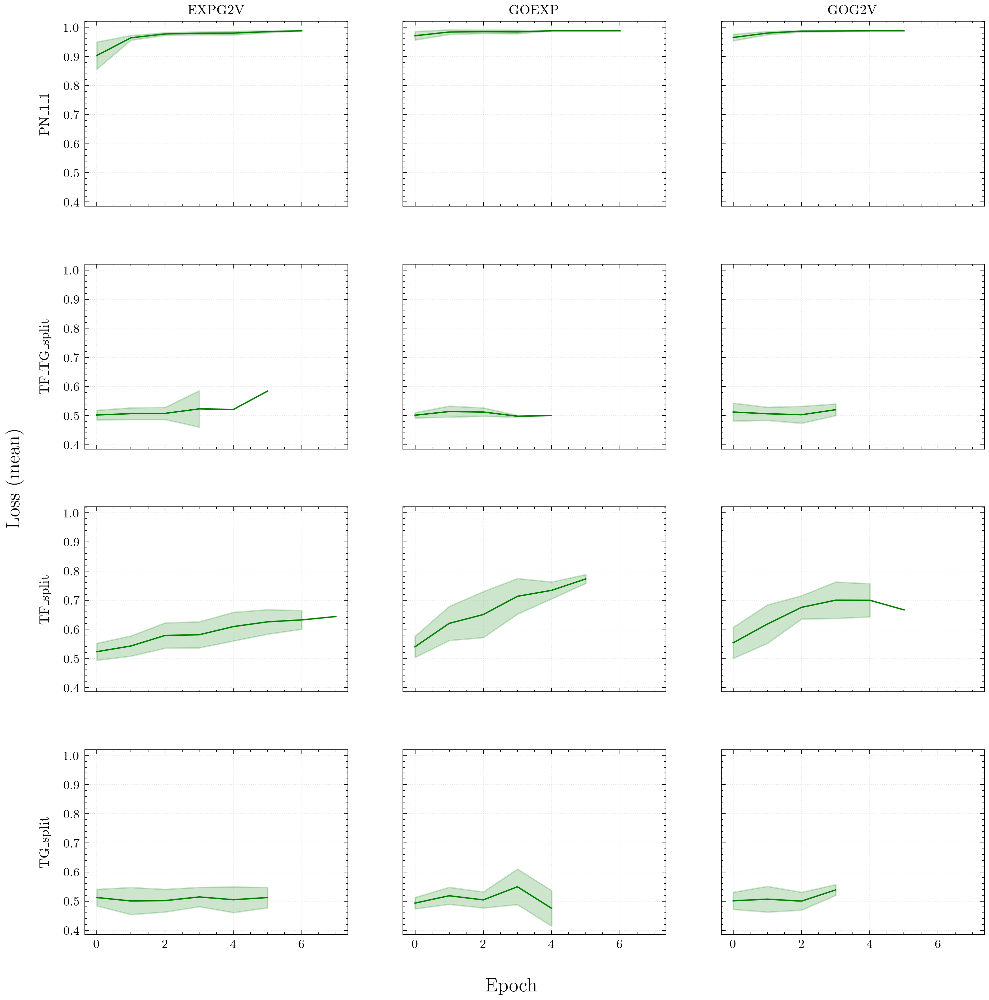

In [319]:
acc_plot(val, ["EXPG2V", "GOEXP", "GOG2V"])
plt.savefig(db_rand.joinpath("accuracy.png"), dpi=400, bbox_inches="tight")

In [320]:
roc, prc = auc_scores(test)
roc_df = pd.DataFrame.from_dict(roc).melt()
prc_df = pd.DataFrame.from_dict(prc).melt()


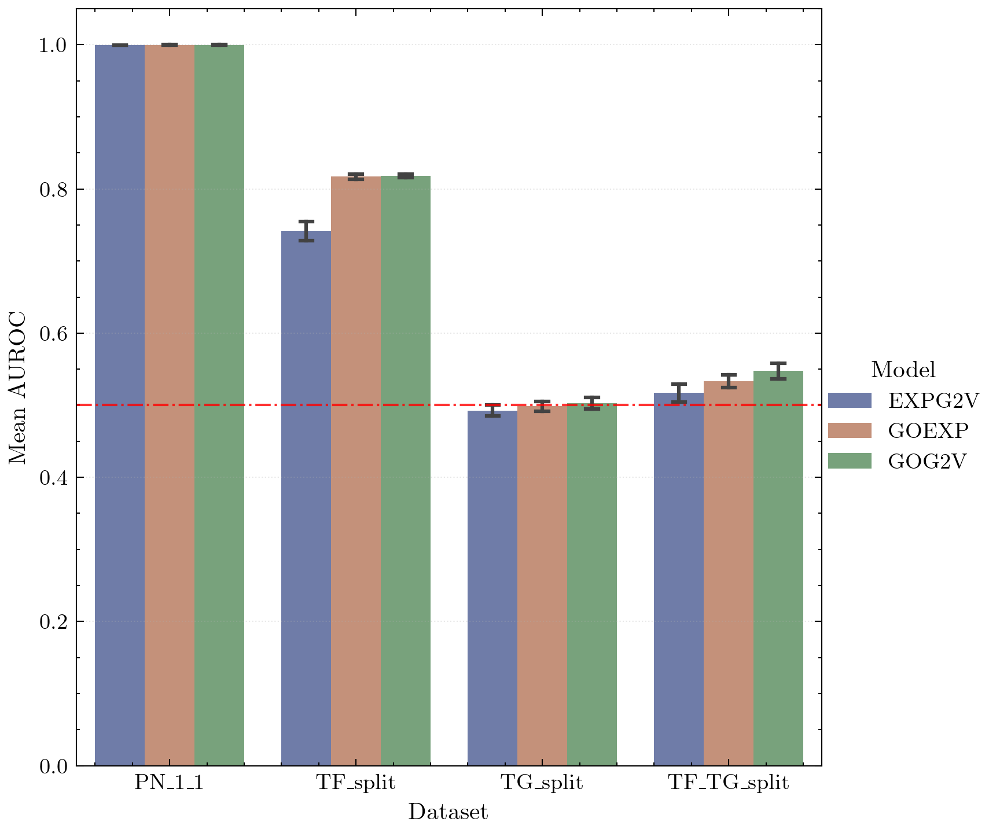

In [321]:
grouped_bar(roc_df)
plt.savefig(db_rand.joinpath("mean_AUROC.png"), dpi=400, bbox_inches="tight")

In [322]:
performance_report(test)

Precision    Recall  F1-score  Accuracy
PN_1_1      EXPG2V   0.984266  0.996345  0.990269  0.990898
            GOEXP    0.988321  0.994256  0.991279  0.991869
            GOG2V    0.986093  0.999739  0.992869  0.993325
TF_split    EXPG2V   0.650747  0.646129  0.648430  0.649677
            GOEXP    0.762532  0.672258  0.714555  0.731452
            GOG2V    0.705573  0.735161  0.720063  0.714194
TG_split    EXPG2V   0.491576  0.515457  0.503234  0.491167
            GOEXP    0.507261  0.319558  0.392104  0.504574
            GOG2V    0.504631  0.395268  0.443304  0.503628
TF_TG_split EXPG2V   0.509407  0.591597  0.547434  0.510924
            GOEXP    0.507679  0.500000  0.503810  0.507563
            GOG2V    0.509446  0.679832  0.582433  0.512605

In [323]:
stest = pd.read_table(single.joinpath(ftest), index_col=0)
rtest = pd.read_table(rand_emb.joinpath(ftest), index_col=0)


performance_report(stest) - performance_report(rtest)

Precision    Recall  F1-score  Accuracy
PN_1_1      EXP   0.005071 -0.004700  0.000222  0.000243
            G2V  -0.018487  0.045953  0.010998  0.007039
            GO    0.010304 -0.008616  0.000840  0.000850
TF_split    EXP   0.167583  0.243226  0.207478  0.187742
            G2V   0.117171  0.059355  0.088022  0.110484
            GO    0.127079  0.133548  0.130270  0.130806
TG_split    EXP   0.056237  0.331230  0.197284  0.062618
            G2V   0.002282 -0.073502 -0.031860  0.001577
            GO    0.069681  0.502208  0.278210  0.104416
TF_TG_split EXP   0.175021  0.024370  0.112549  0.181933
            G2V   0.040493  0.028571  0.034422  0.039496
            GO    0.228889  0.006723  0.120352  0.196639

# Double embedding (Addition)

In [260]:
pair = Path("../media2/binary/double_embedding/addition")

train = pd.read_table(pair.joinpath(ftrain), index_col=0)
val = pd.read_table(pair.joinpath(fval), index_col=0)
test = pd.read_table(pair.joinpath(ftest), index_col=0)

['PN_1_1', 'TF_TG_split', 'TF_split', 'TG_split']
0 0 ('PN_1_1', 'EXPG2V')
0 1 ('PN_1_1', 'GOEXP')
0 2 ('PN_1_1', 'GOG2V')
1 0 ('TF_TG_split', 'EXPG2V')
1 1 ('TF_TG_split', 'GOEXP')
1 2 ('TF_TG_split', 'GOG2V')
2 0 ('TF_split', 'EXPG2V')
2 1 ('TF_split', 'GOEXP')
2 2 ('TF_split', 'GOG2V')
3 0 ('TG_split', 'EXPG2V')
3 1 ('TG_split', 'GOEXP')
3 2 ('TG_split', 'GOG2V')


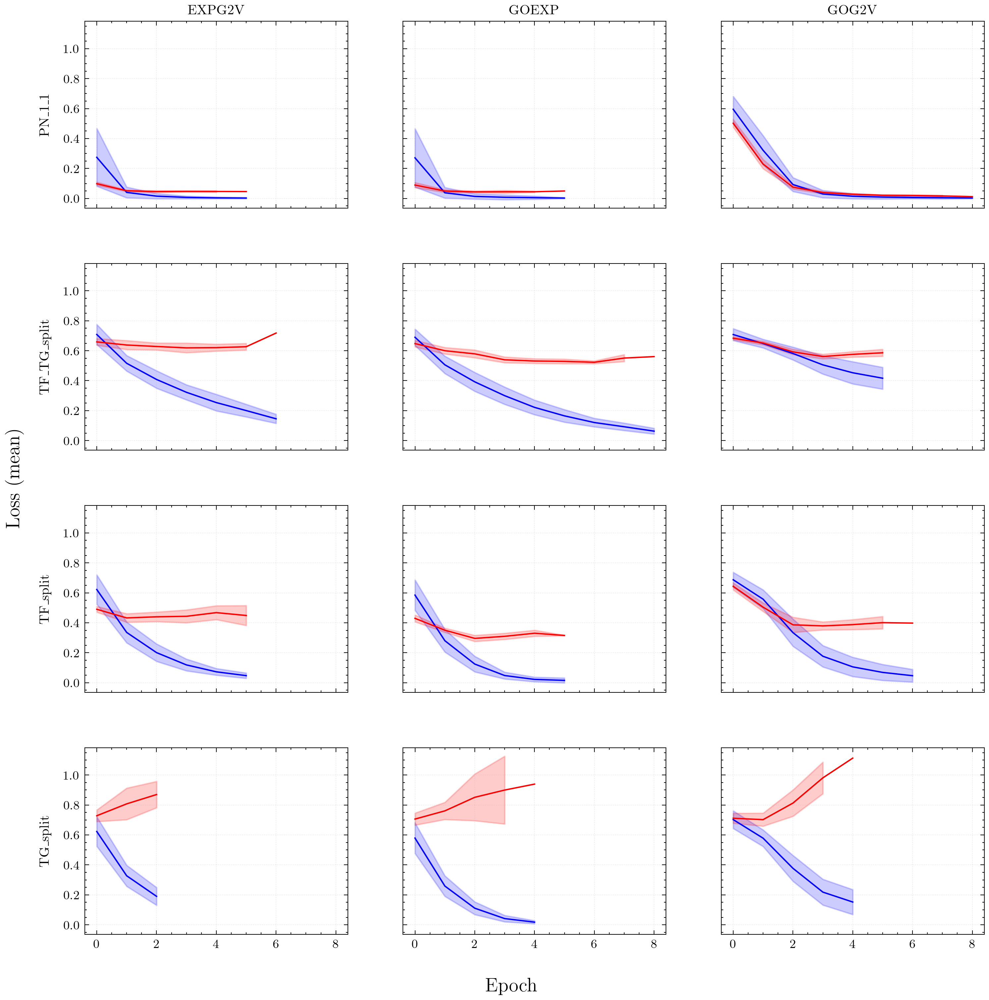

In [261]:
loss_plot(train, val, ["EXPG2V", "GOEXP", "GOG2V"])
plt.savefig(pair.joinpath("loss_plot.png"), dpi=400, bbox_inches="tight")

['PN_1_1', 'TF_TG_split', 'TF_split', 'TG_split']
0 0 ('PN_1_1', 'EXPG2V')
0 1 ('PN_1_1', 'GOEXP')
0 2 ('PN_1_1', 'GOG2V')
1 0 ('TF_TG_split', 'EXPG2V')
1 1 ('TF_TG_split', 'GOEXP')
1 2 ('TF_TG_split', 'GOG2V')
2 0 ('TF_split', 'EXPG2V')
2 1 ('TF_split', 'GOEXP')
2 2 ('TF_split', 'GOG2V')
3 0 ('TG_split', 'EXPG2V')
3 1 ('TG_split', 'GOEXP')
3 2 ('TG_split', 'GOG2V')


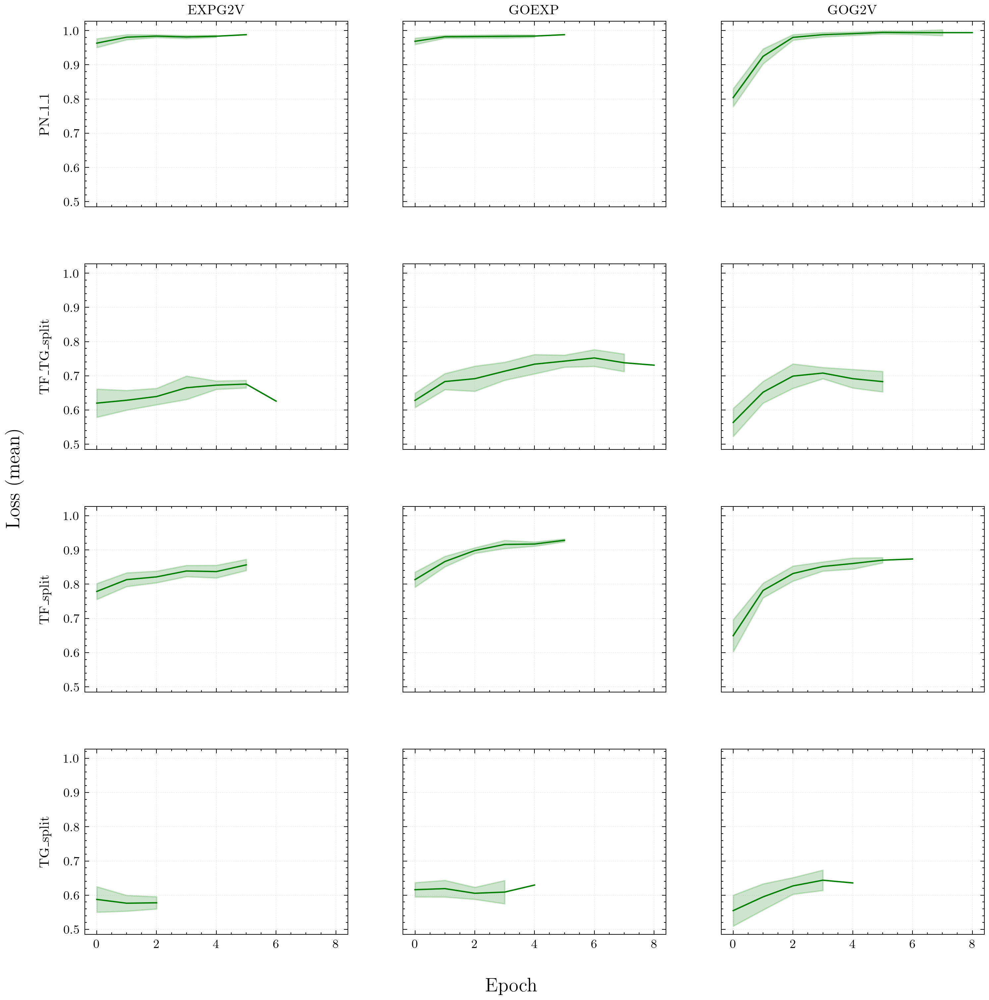

In [262]:
acc_plot(val, ["EXPG2V", "GOEXP", "GOG2V"])
plt.savefig(pair.joinpath("accuracy.png"), dpi=400, bbox_inches="tight")

In [263]:
roc, prc = auc_scores(test)
roc_df = pd.DataFrame.from_dict(roc).melt()
prc_df = pd.DataFrame.from_dict(prc).melt()


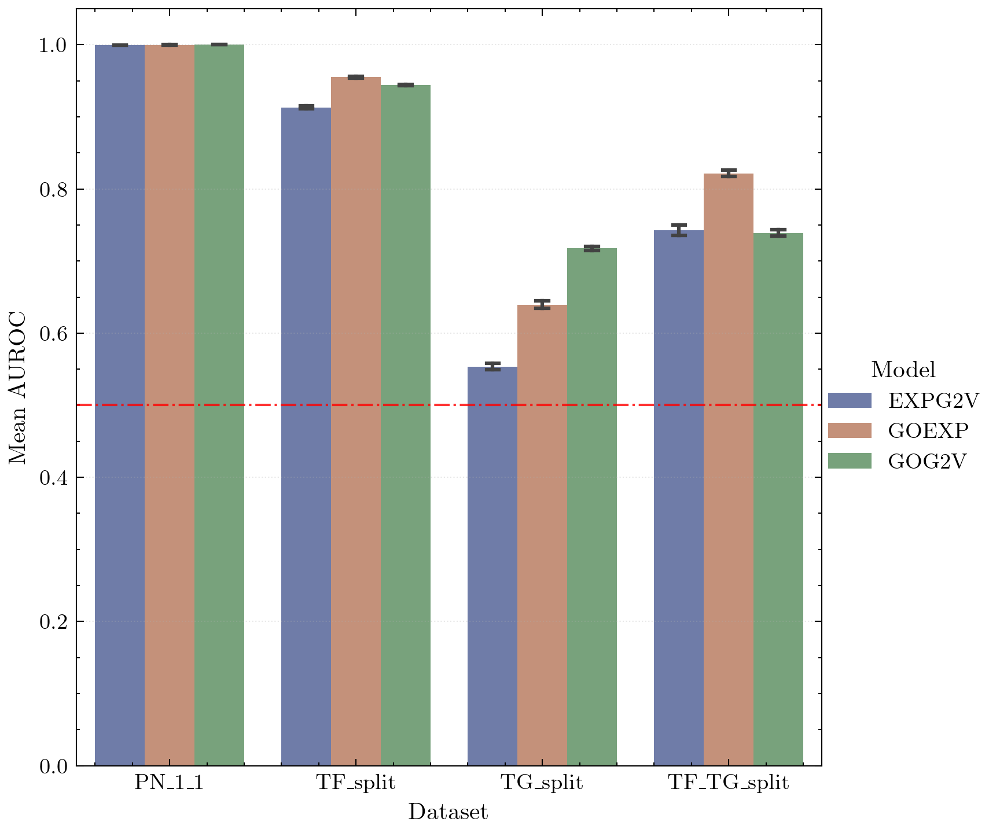

In [264]:
grouped_bar(roc_df)
plt.savefig(pair.joinpath("mean_AUROC.png"), dpi=400, bbox_inches="tight")

In [265]:
# for name, frame in test.groupby(["Dataset", "Model"]):
#     print(name)
#     thres = (frame.Pred >= 0.5).astype(int)
#     count = (frame.Label == thres).value_counts(normalize=True)
#     print(count)
#     print()

In [266]:
performance_report(test) 

Precision    Recall  F1-score  Accuracy
PN_1_1      EXPG2V   0.991658  0.993211  0.992434  0.992961
            GOEXP    0.991660  0.993473  0.992566  0.993083
            GOG2V    0.997115  0.992689  0.994897  0.995267
TF_split    EXPG2V   0.848276  0.833226  0.840683  0.842097
            GOEXP    0.910503  0.869677  0.889622  0.892097
            GOG2V    0.875121  0.874839  0.874980  0.875000
TG_split    EXPG2V   0.526048  0.684858  0.595039  0.533912
            GOEXP    0.557436  0.831230  0.667342  0.585647
            GOG2V    0.566883  0.854259  0.681515  0.600789
TF_TG_split EXPG2V   0.663954  0.685714  0.674659  0.669328
            GOEXP    0.731707  0.756303  0.743802  0.739496
            GOG2V    0.697464  0.647059  0.671316  0.683193

In [267]:
ptest = pd.read_table(pair.joinpath(ftest), index_col=0)
db_rand = pd.read_table(db_rand.joinpath(ftest), index_col=0)
performance_report(ptest) - performance_report(db_rand)

FileNotFoundError: [Errno 2] No such file or directory: '../media2/binary/double_embedding/random_embedding_addition/test_stats.tsv'

In [75]:
performance_report(stest) - performance_report(rand_emb)

AttributeError: 'PosixPath' object has no attribute 'groupby'

# Double Embedding Random (Concat)

In [268]:
db_conc_rand = Path("/home/llan/Desktop/WUR/thesis2/media2/binary/double_embedding/random_embedding_concat")
train = pd.read_table(db_conc_rand.joinpath(ftrain), index_col=0)
val = pd.read_table(db_conc_rand.joinpath(fval), index_col=0)
test = pd.read_table(db_conc_rand.joinpath(ftest), index_col=0)

In [269]:
train.Model.unique()

array(['GOG2V', 'GOEXP', 'EXPG2V'], dtype=object)

['PN_1_1', 'TF_TG_split', 'TF_split', 'TG_split']
0 0 ('PN_1_1', 'EXPG2V')
0 1 ('PN_1_1', 'GOEXP')
0 2 ('PN_1_1', 'GOG2V')
1 0 ('TF_TG_split', 'EXPG2V')
1 1 ('TF_TG_split', 'GOEXP')
1 2 ('TF_TG_split', 'GOG2V')
2 0 ('TF_split', 'EXPG2V')
2 1 ('TF_split', 'GOEXP')
2 2 ('TF_split', 'GOG2V')
3 0 ('TG_split', 'EXPG2V')
3 1 ('TG_split', 'GOEXP')
3 2 ('TG_split', 'GOG2V')


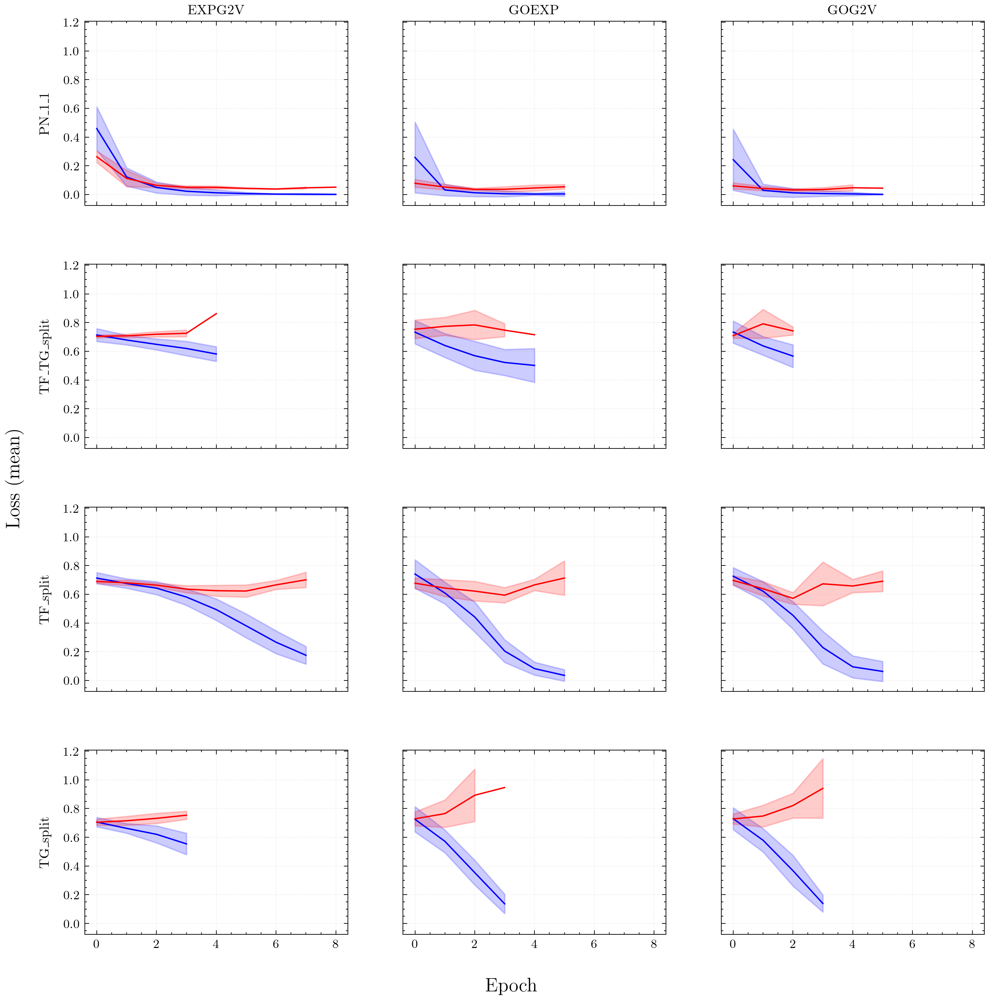

In [272]:
loss_plot(train, val, ["EXPG2V", "GOEXP", "GOG2V"])
plt.savefig(db_conc_rand.joinpath("loss_plot.png"), dpi=400, bbox_inches="tight")

['PN_1_1', 'TF_TG_split', 'TF_split', 'TG_split']
0 0 ('PN_1_1', 'EXPG2V')
0 1 ('PN_1_1', 'GOEXP')
0 2 ('PN_1_1', 'GOG2V')
1 0 ('TF_TG_split', 'EXPG2V')
1 1 ('TF_TG_split', 'GOEXP')
1 2 ('TF_TG_split', 'GOG2V')
2 0 ('TF_split', 'EXPG2V')
2 1 ('TF_split', 'GOEXP')
2 2 ('TF_split', 'GOG2V')
3 0 ('TG_split', 'EXPG2V')
3 1 ('TG_split', 'GOEXP')
3 2 ('TG_split', 'GOG2V')


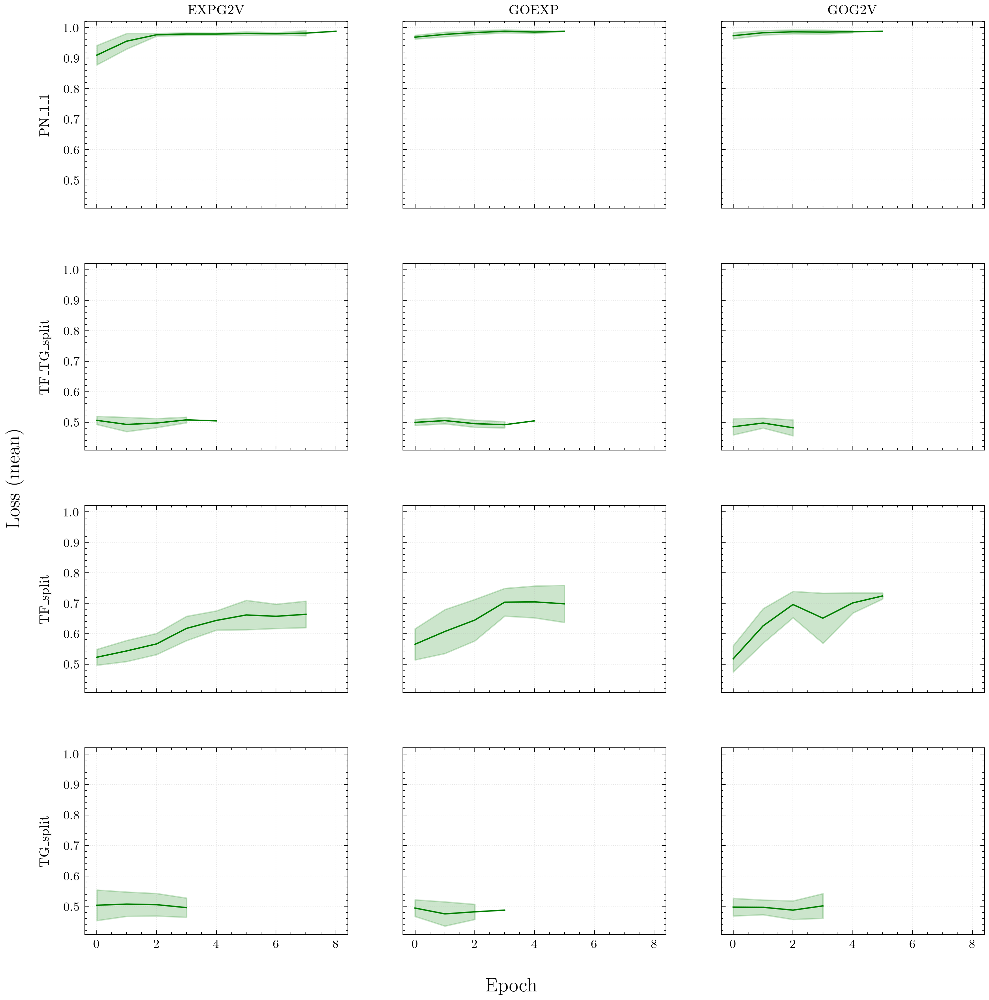

In [273]:
acc_plot(val, ["EXPG2V", "GOEXP", "GOG2V"])
plt.savefig(db_conc_rand.joinpath("acc_plot.png"), dpi=400, bbox_inches="tight")

In [274]:
roc, prc = auc_scores(test)
roc_df = pd.DataFrame(roc).melt()
prc_df = roc_df = pd.DataFrame(prc).melt()

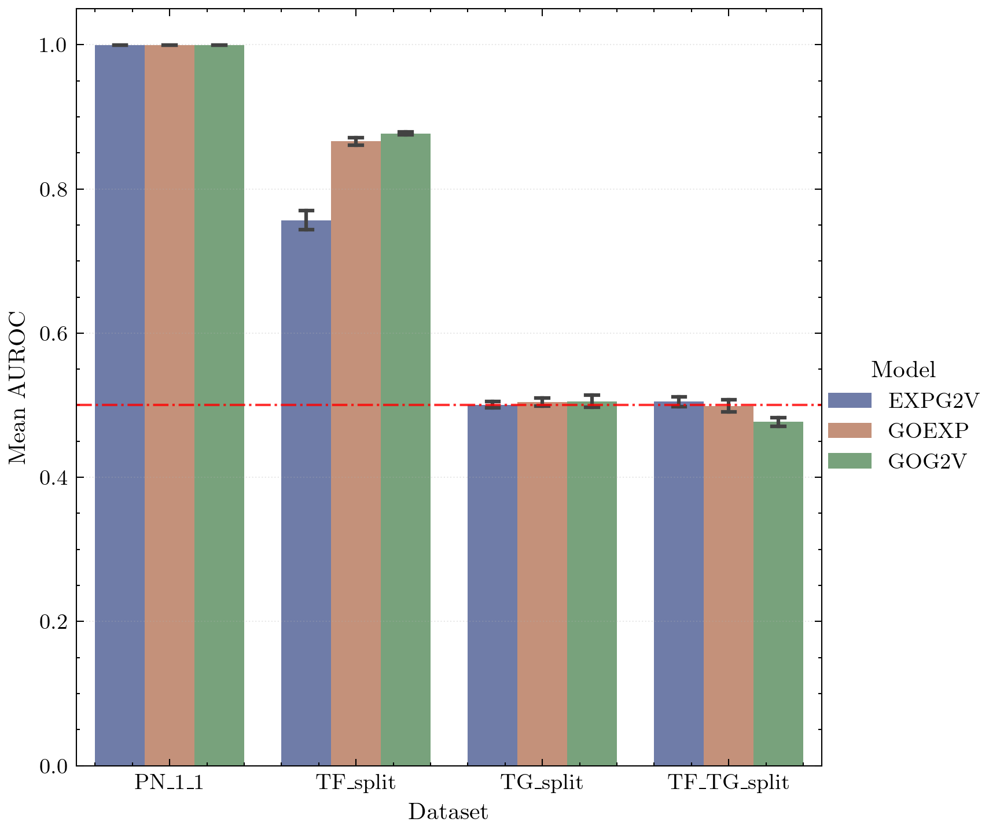

In [275]:
grouped_bar(roc_df)
plt.savefig(db_conc_rand.joinpath("mean_AUROC.png"), bbox_inches="tight", dpi=400)

In [276]:
performance_report(test)

Precision    Recall  F1-score  Accuracy
PN_1_1      EXPG2V   0.987555  0.994517  0.991024  0.991626
            GOEXP    0.987600  0.998172  0.992858  0.993325
            GOG2V    0.984025  0.997128  0.990533  0.991141
TF_split    EXPG2V   0.622609  0.703548  0.660609  0.638548
            GOEXP    0.655153  0.752581  0.700495  0.678226
            GOG2V    0.712696  0.764194  0.737547  0.728065
TG_split    EXPG2V   0.492431  0.502839  0.497581  0.492271
            GOEXP    0.501709  0.370347  0.426134  0.501262
            GOG2V    0.496496  0.424606  0.457745  0.497003
TF_TG_split EXPG2V   0.497558  0.599160  0.543652  0.497059
            GOEXP    0.492958  0.588235  0.536398  0.491597
            GOG2V    0.482595  0.512605  0.497148  0.481513

# Double Embedding (Concat)

In [277]:
db_conc = Path("/home/llan/Desktop/WUR/thesis2/media2/binary/double_embedding/concat")
train = pd.read_table(db_conc.joinpath(ftrain), index_col=0)
val = pd.read_table(db_conc.joinpath(fval), index_col=0)
test = pd.read_table(db_conc.joinpath(ftest), index_col=0)

['PN_1_1', 'TF_TG_split', 'TF_split', 'TG_split']
0 0 ('PN_1_1', 'EXPG2V')
0 1 ('PN_1_1', 'GOEXP')
0 2 ('PN_1_1', 'GOG2V')
1 0 ('TF_TG_split', 'EXPG2V')
1 1 ('TF_TG_split', 'GOEXP')
1 2 ('TF_TG_split', 'GOG2V')
2 0 ('TF_split', 'EXPG2V')
2 1 ('TF_split', 'GOEXP')
2 2 ('TF_split', 'GOG2V')
3 0 ('TG_split', 'EXPG2V')
3 1 ('TG_split', 'GOEXP')
3 2 ('TG_split', 'GOG2V')


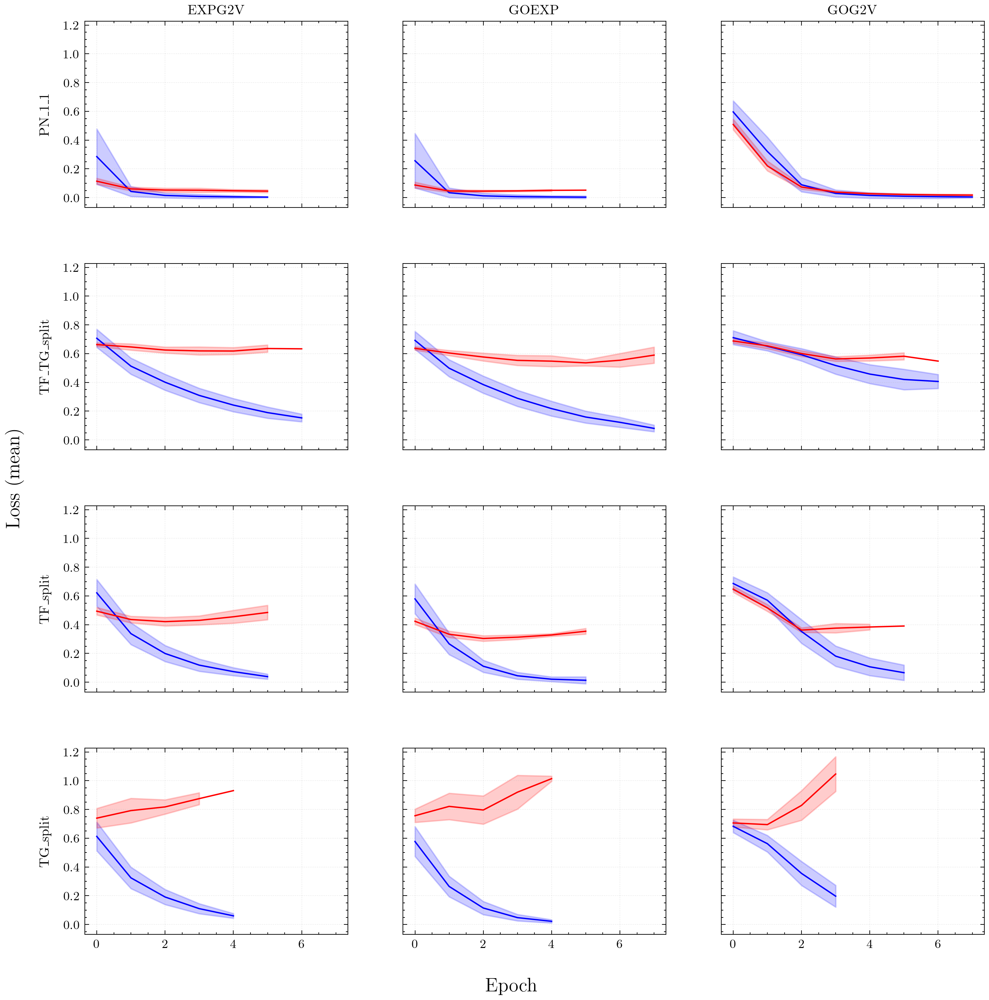

In [278]:
loss_plot(train, val, ["EXPG2V", "GOEXP", "GOG2V"])
plt.savefig(db_conc.joinpath("loss_plot.png"), dpi=400, bbox_inches="tight")

['PN_1_1', 'TF_TG_split', 'TF_split', 'TG_split']
0 0 ('PN_1_1', 'EXPG2V')
0 1 ('PN_1_1', 'GOEXP')
0 2 ('PN_1_1', 'GOG2V')
1 0 ('TF_TG_split', 'EXPG2V')
1 1 ('TF_TG_split', 'GOEXP')
1 2 ('TF_TG_split', 'GOG2V')
2 0 ('TF_split', 'EXPG2V')
2 1 ('TF_split', 'GOEXP')
2 2 ('TF_split', 'GOG2V')
3 0 ('TG_split', 'EXPG2V')
3 1 ('TG_split', 'GOEXP')
3 2 ('TG_split', 'GOG2V')


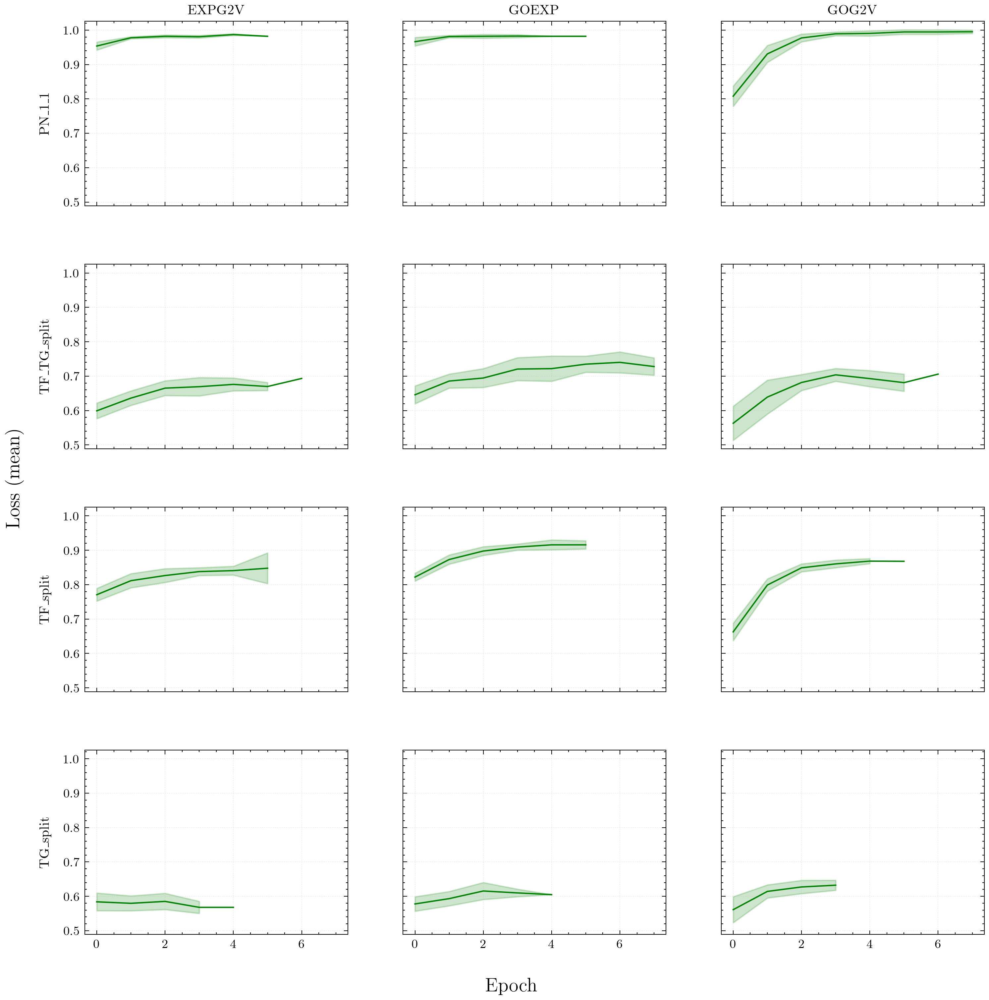

In [279]:
acc_plot(val, ["EXPG2V", "GOEXP", "GOG2V"])
plt.savefig(db_conc.joinpath("accuracy.png"),dpi=400, bbox_inches="tight")

In [280]:
roc, prc = auc_scores(test)
roc = pd.DataFrame(roc).melt()
prc = pd.DataFrame(prc).melt()

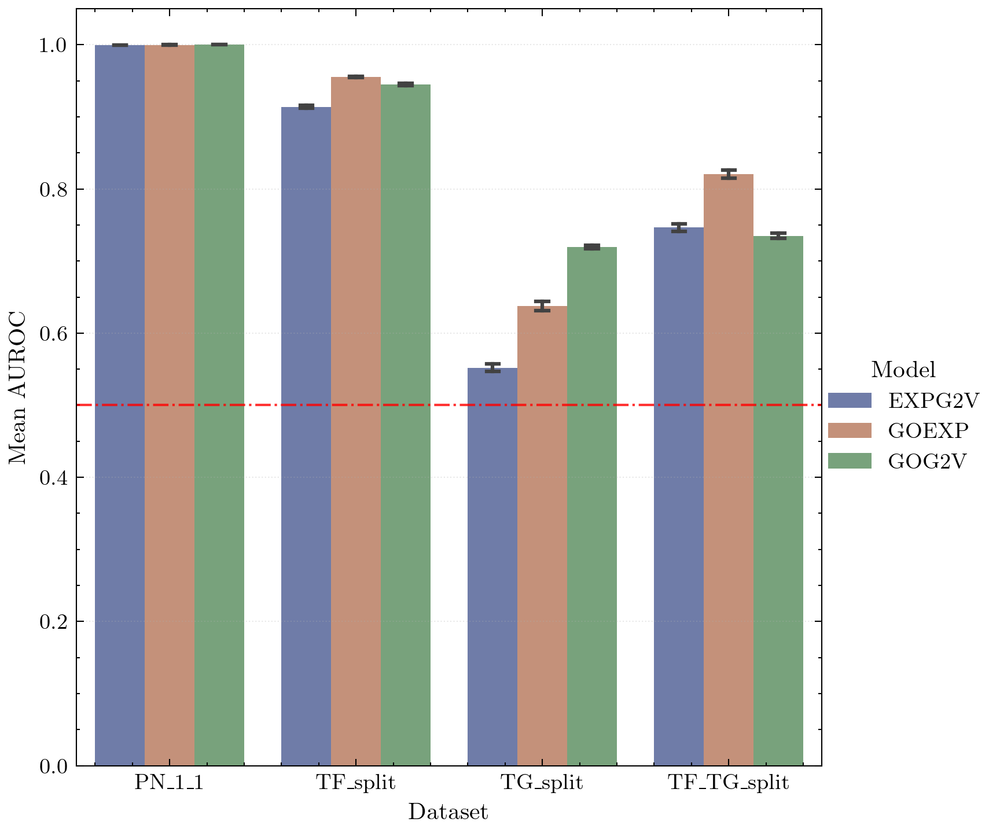

In [281]:
grouped_bar(roc)
plt.savefig(db_conc.joinpath("mean_AUROC.png"), dpi=400, bbox_inches="tight")

In [282]:
performance_report(test)

Precision    Recall  F1-score  Accuracy
PN_1_1      EXPG2V   0.991137  0.992689  0.991912  0.992476
            GOEXP    0.992185  0.994517  0.993350  0.993811
            GOG2V    0.997371  0.990601  0.993974  0.994417
TF_split    EXPG2V   0.841710  0.831935  0.836794  0.837742
            GOEXP    0.918652  0.870645  0.894005  0.896774
            GOG2V    0.884641  0.873226  0.878896  0.879677
TG_split    EXPG2V   0.526618  0.664669  0.587645  0.533596
            GOEXP    0.557721  0.812303  0.661359  0.584069
            GOG2V    0.560792  0.867192  0.681120  0.594006
TF_TG_split EXPG2V   0.664804  0.700000  0.681948  0.673529
            GOEXP    0.728314  0.747899  0.737977  0.734454
            GOG2V    0.701689  0.628571  0.663121  0.680672

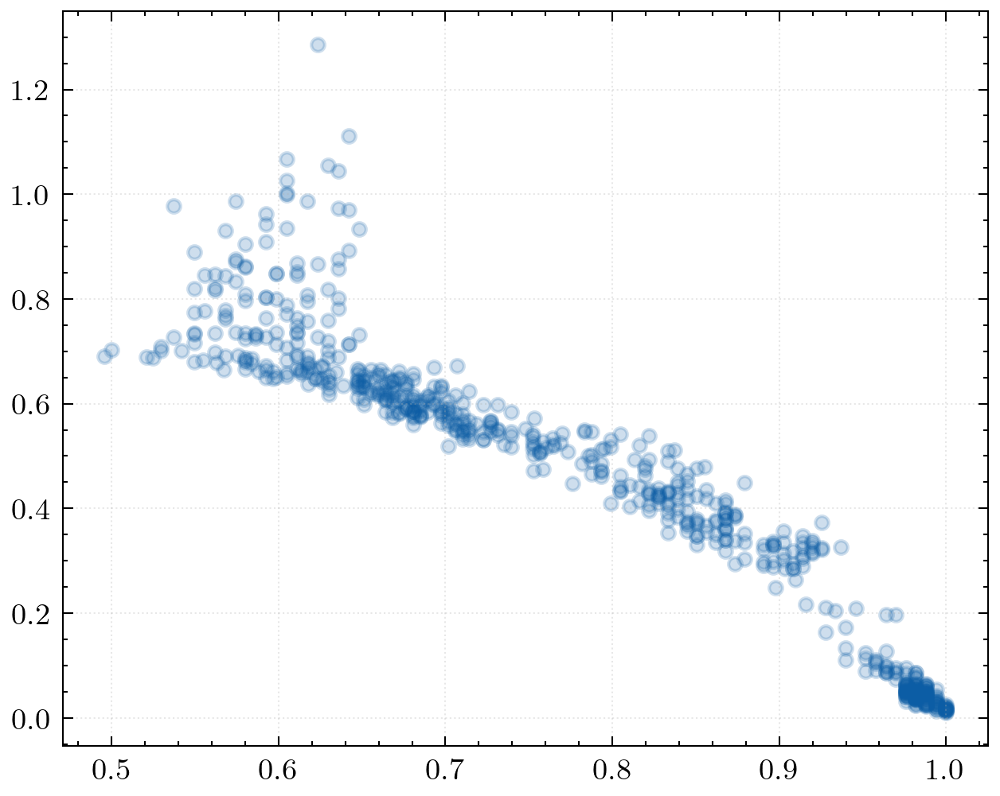

In [283]:
plt.scatter(val.Accuracy, val.Mean_loss, alpha=0.2)

# GO random

In [285]:
go_random = Path("../media2/binary/go/random_embedding")

train = pd.read_table(go_random.joinpath(ftrain), index_col=0)
val = pd.read_table(go_random.joinpath(fval), index_col=0)
test = pd.read_table(go_random.joinpath(ftest), index_col=0)

['PN_1_1', 'TF_TG_split', 'TF_split', 'TG_split']
0 0 ('PN_1_1', 'GO_ALL')
0 1 ('PN_1_1', 'GO_COMP')
0 2 ('PN_1_1', 'GO_IEA')
1 0 ('TF_TG_split', 'GO_ALL')
1 1 ('TF_TG_split', 'GO_COMP')
1 2 ('TF_TG_split', 'GO_IEA')
2 0 ('TF_split', 'GO_ALL')
2 1 ('TF_split', 'GO_COMP')
2 2 ('TF_split', 'GO_IEA')
3 0 ('TG_split', 'GO_ALL')
3 1 ('TG_split', 'GO_COMP')
3 2 ('TG_split', 'GO_IEA')


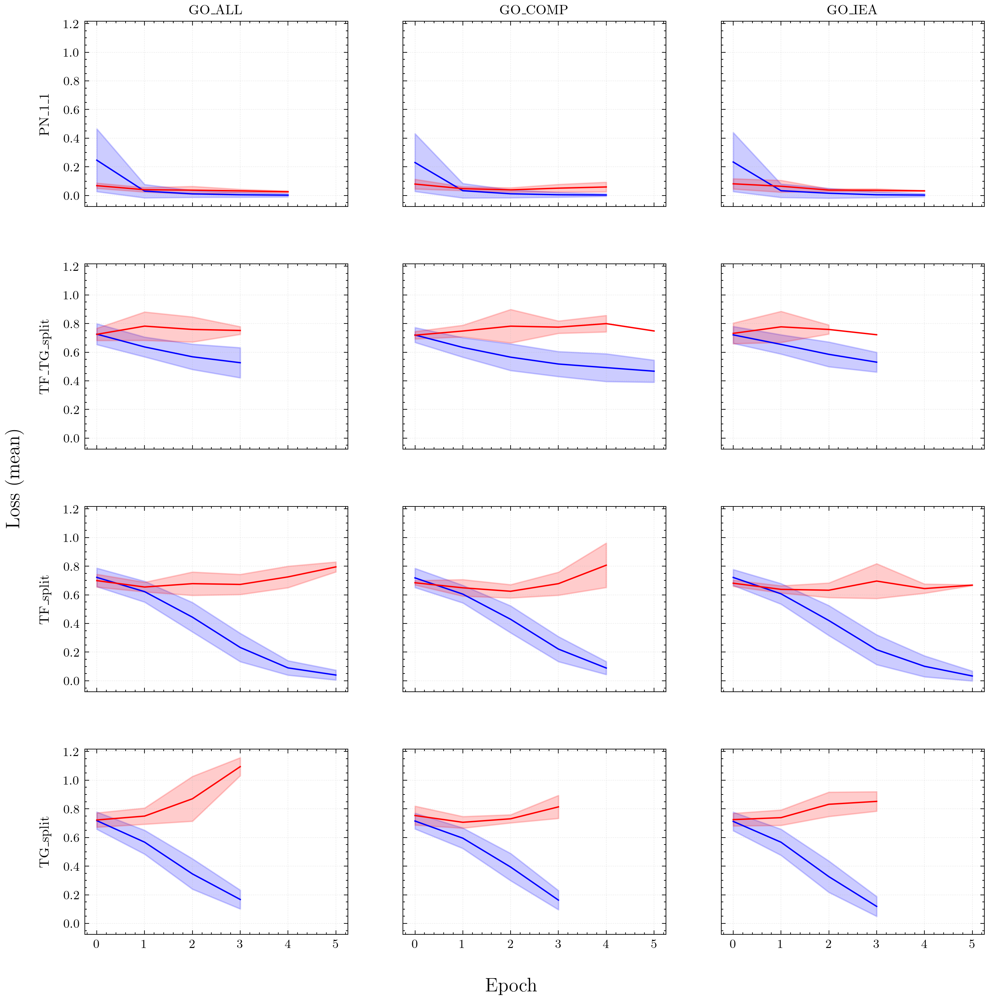

In [286]:
loss_plot(train, val, ["GO_ALL", "GO_COMP", "GO_IEA"])
plt.savefig(go_random.joinpath("loss_plot.png"), dpi=400, bbox_inches="tight")

['PN_1_1', 'TF_TG_split', 'TF_split', 'TG_split']
0 0 ('PN_1_1', 'GO_ALL')
0 1 ('PN_1_1', 'GO_COMP')
0 2 ('PN_1_1', 'GO_IEA')
1 0 ('TF_TG_split', 'GO_ALL')
1 1 ('TF_TG_split', 'GO_COMP')
1 2 ('TF_TG_split', 'GO_IEA')
2 0 ('TF_split', 'GO_ALL')
2 1 ('TF_split', 'GO_COMP')
2 2 ('TF_split', 'GO_IEA')
3 0 ('TG_split', 'GO_ALL')
3 1 ('TG_split', 'GO_COMP')
3 2 ('TG_split', 'GO_IEA')


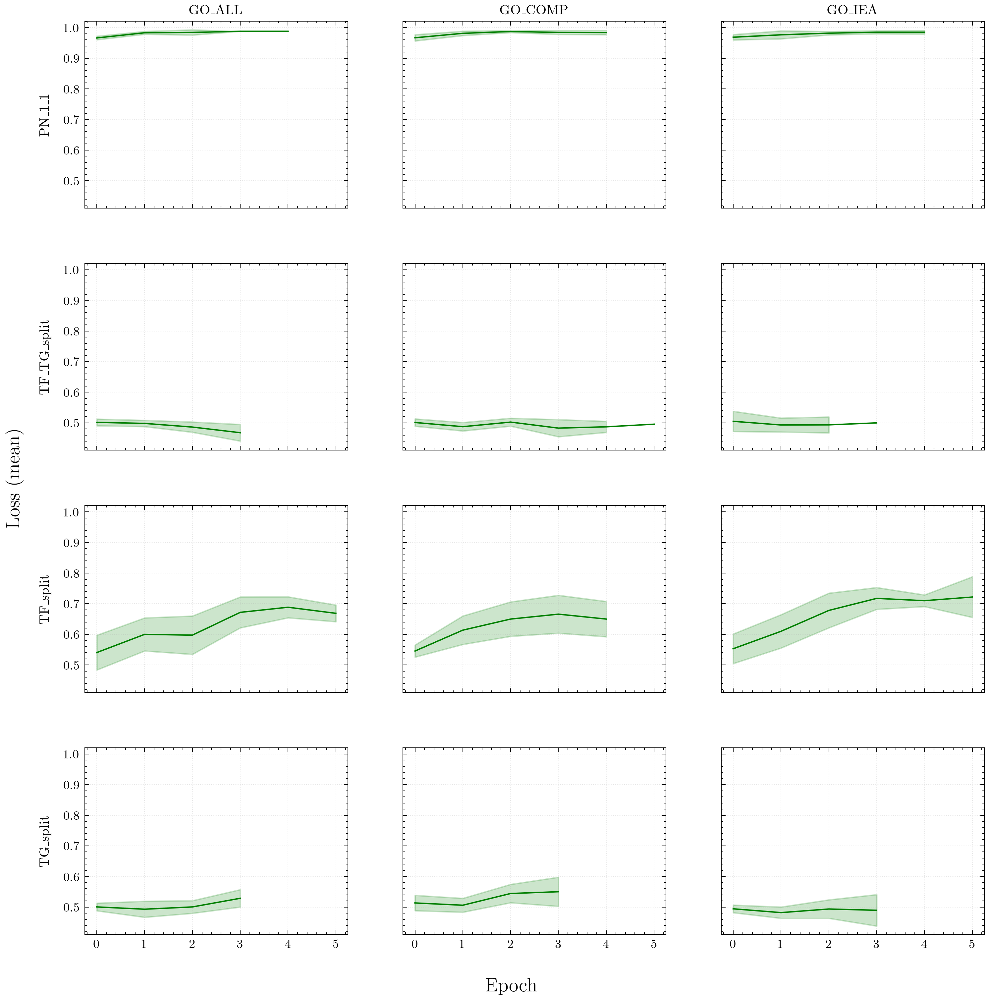

In [287]:
acc_plot(val, ["GO_ALL", "GO_COMP", "GO_IEA"])
plt.savefig(go_random.joinpath("accuracy.png"), dpi=400, bbox_inches="tight")

In [288]:
roc, prc = auc_scores(test)
roc_df = pd.DataFrame.from_dict(roc).melt()
prc_df = pd.DataFrame.from_dict(prc).melt()

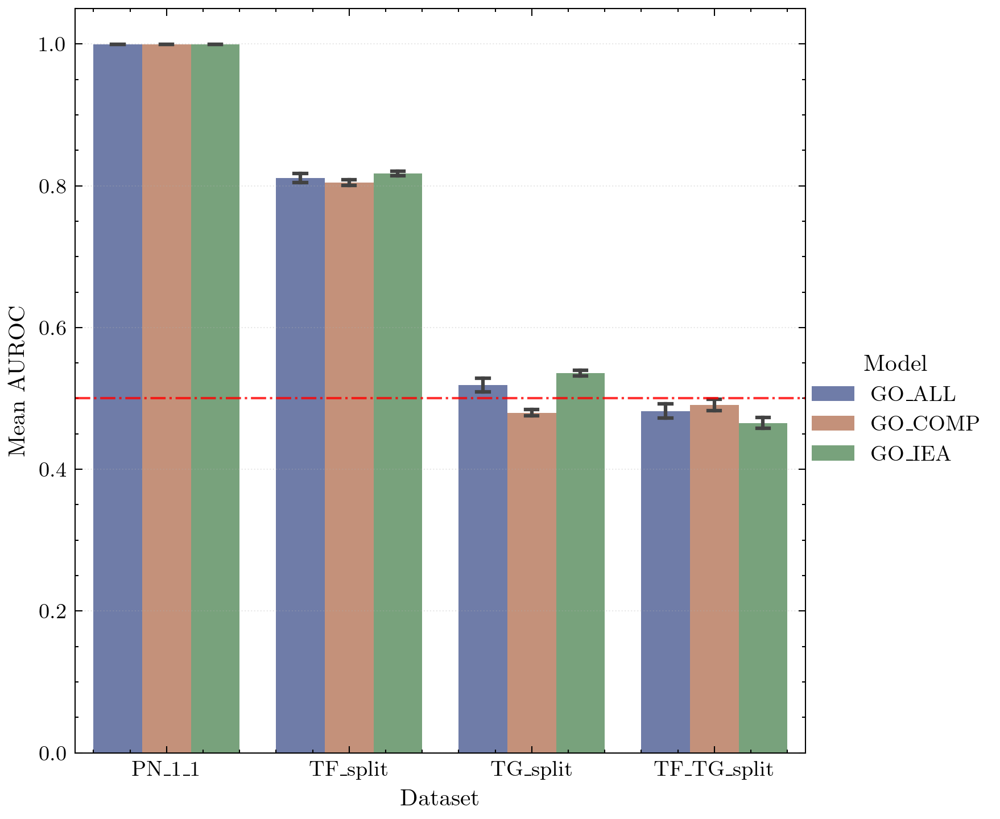

In [289]:
grouped_bar(roc_df)
plt.savefig(go_random.joinpath("mean_AUROC.png"), dpi=400, bbox_inches="tight")

In [290]:
performance_report(test)

Precision    Recall  F1-score  Accuracy
PN_1_1      GO_ALL    0.986405  0.998148  0.992242  0.992778
            GO_COMP   0.985371  0.997884  0.991588  0.992166
            GO_IEA    0.986935  0.999206  0.993033  0.993513
TF_split    GO_ALL    0.683352  0.796721  0.735695  0.696875
            GO_COMP   0.620525  0.852459  0.718232  0.645833
            GO_IEA    0.800454  0.694426  0.743680  0.746528
TG_split    GO_ALL    0.513375  0.444762  0.476612  0.507680
            GO_COMP   0.473982  0.266032  0.340789  0.481280
            GO_IEA    0.523310  0.285079  0.369092  0.508800
TF_TG_split GO_ALL    0.486989  0.555085  0.518812  0.480769
            GO_COMP   0.498186  0.349153  0.410563  0.494444
            GO_IEA    0.498333  0.506780  0.502521  0.494017

# GO exp 

In [291]:
go_exp = Path("../media2/binary/go/experimental")

train = pd.read_table(go_exp.joinpath(ftrain), index_col=0)
val = pd.read_table(go_exp.joinpath(fval), index_col=0)
test = pd.read_table(go_exp.joinpath(ftest), index_col=0)

['PN_1_1', 'TF_TG_split', 'TF_split', 'TG_split']
0 0 ('PN_1_1', 'GO_ALL')
0 1 ('PN_1_1', 'GO_COMP')
0 2 ('PN_1_1', 'GO_IEA')
1 0 ('TF_TG_split', 'GO_ALL')
1 1 ('TF_TG_split', 'GO_COMP')
1 2 ('TF_TG_split', 'GO_IEA')
2 0 ('TF_split', 'GO_ALL')
2 1 ('TF_split', 'GO_COMP')
2 2 ('TF_split', 'GO_IEA')
3 0 ('TG_split', 'GO_ALL')
3 1 ('TG_split', 'GO_COMP')
3 2 ('TG_split', 'GO_IEA')


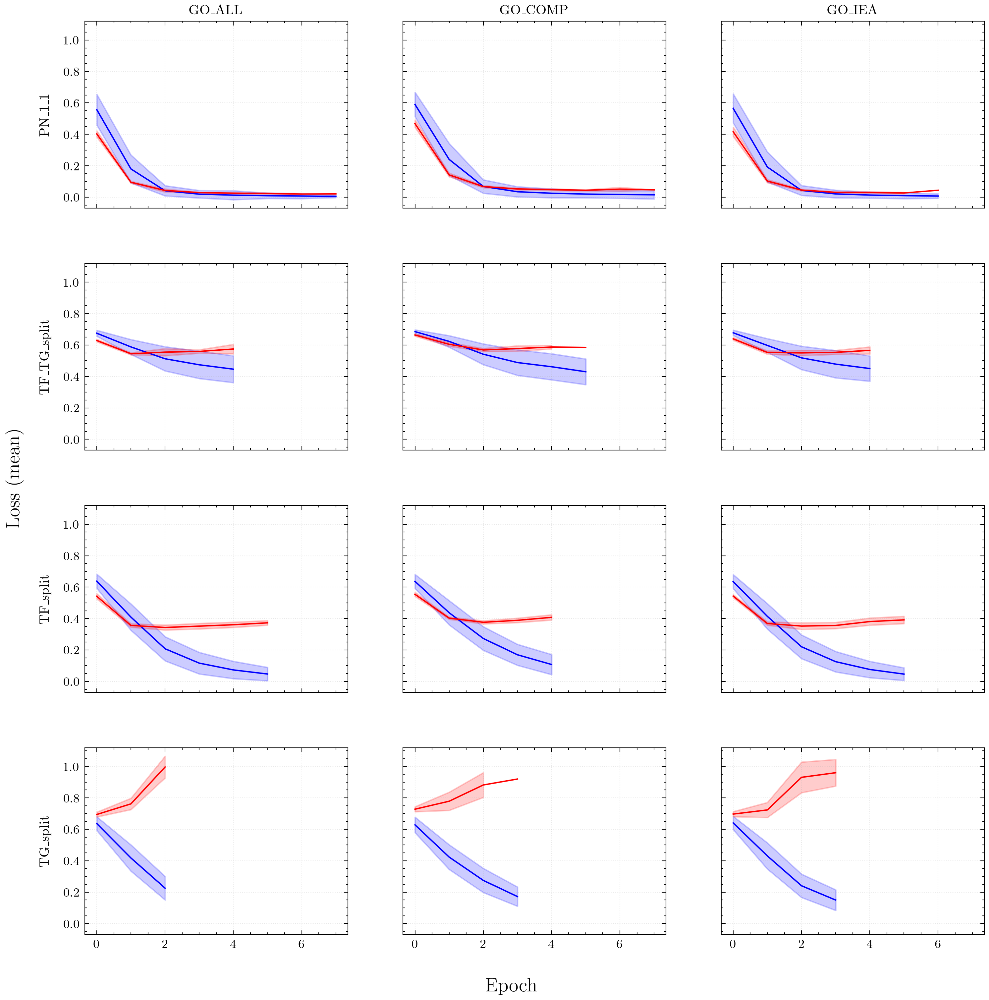

In [292]:
loss_plot(train, val, ["GO_ALL", "GO_COMP", "GO_IEA"])
plt.savefig(go_exp.joinpath("loss_plot.png"), dpi=400, bbox_inches="tight")

['PN_1_1', 'TF_TG_split', 'TF_split', 'TG_split']
0 0 ('PN_1_1', 'GO_ALL')
0 1 ('PN_1_1', 'GO_COMP')
0 2 ('PN_1_1', 'GO_IEA')
1 0 ('TF_TG_split', 'GO_ALL')
1 1 ('TF_TG_split', 'GO_COMP')
1 2 ('TF_TG_split', 'GO_IEA')
2 0 ('TF_split', 'GO_ALL')
2 1 ('TF_split', 'GO_COMP')
2 2 ('TF_split', 'GO_IEA')
3 0 ('TG_split', 'GO_ALL')
3 1 ('TG_split', 'GO_COMP')
3 2 ('TG_split', 'GO_IEA')


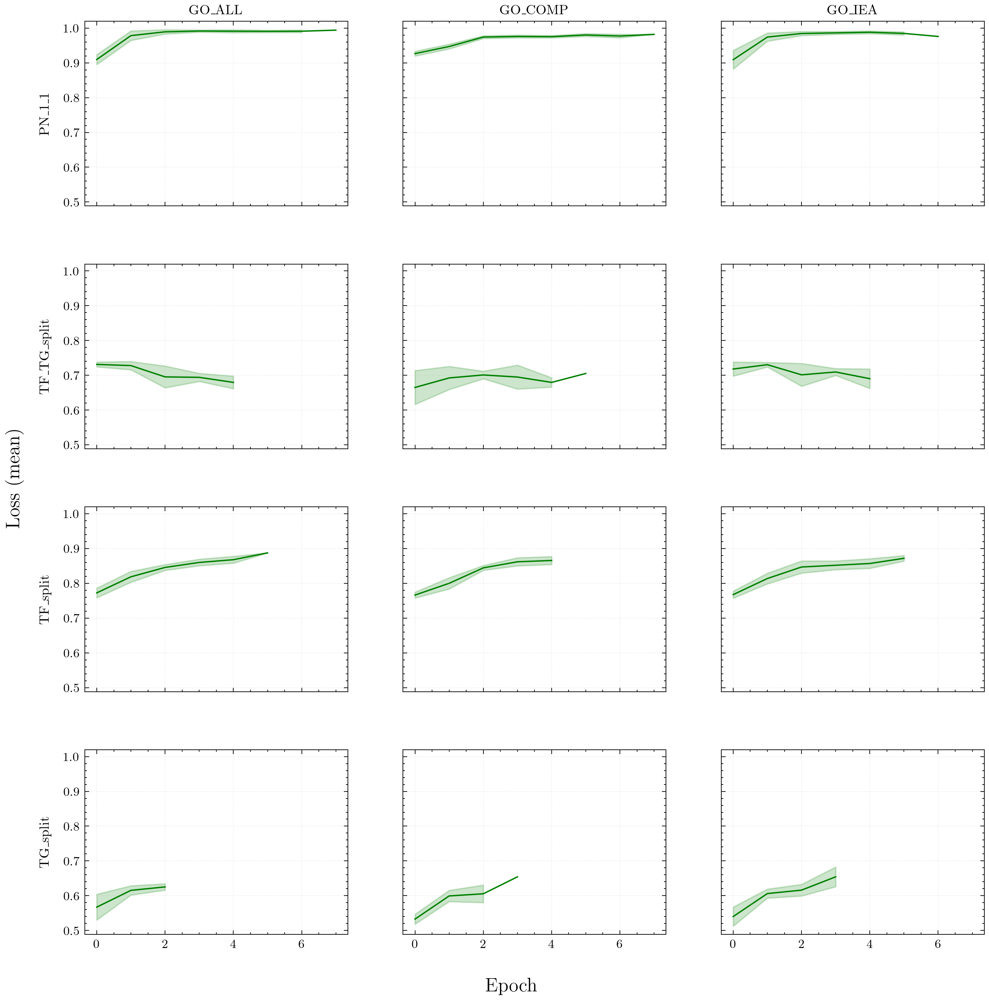

In [293]:
acc_plot(val, ["GO_ALL", "GO_COMP", "GO_IEA"])
plt.savefig(go_exp.joinpath("accuracy.png"), dpi=400, bbox_inches="tight")

In [294]:
roc, prc = auc_scores(test)
roc_df = pd.DataFrame.from_dict(roc).melt()
prc_df = pd.DataFrame.from_dict(prc).melt()

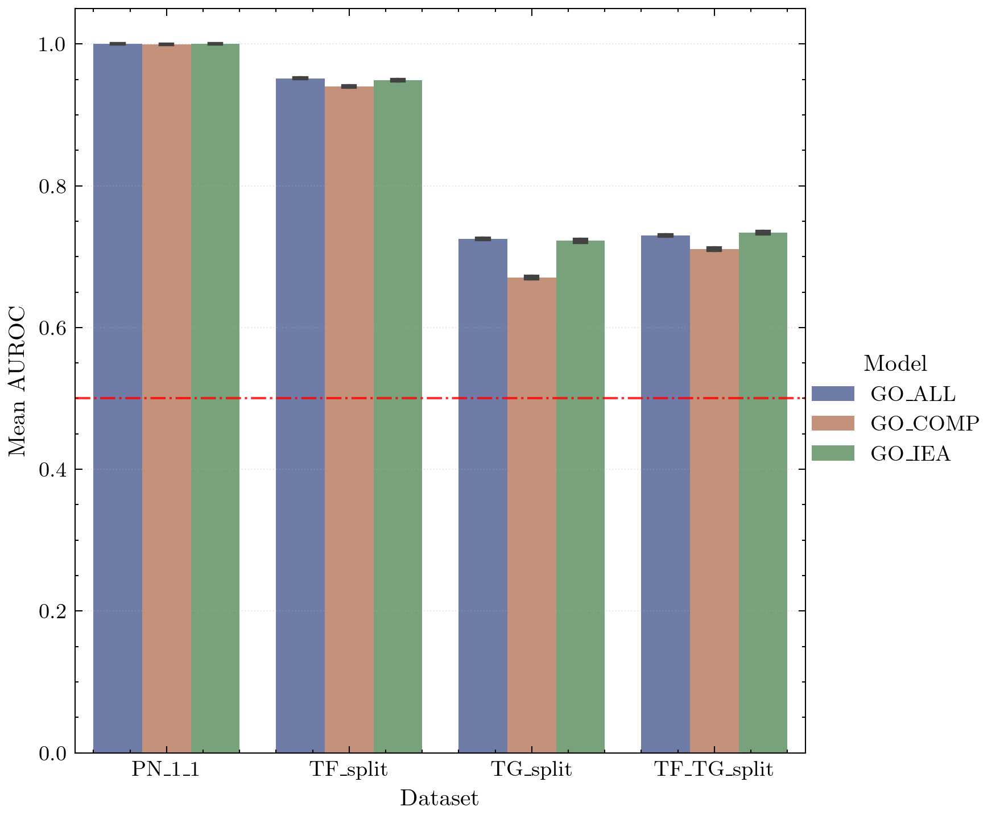

In [295]:
grouped_bar(roc_df)
plt.savefig(go_exp.joinpath("mean_AUROC.png"), dpi=400, bbox_inches="tight")

In [296]:
performance_report(test)

Precision    Recall  F1-score  Accuracy
PN_1_1      GO_ALL    0.997594  0.987302  0.992421  0.993023
            GO_COMP   0.993346  0.987302  0.990314  0.991065
            GO_IEA    0.997058  0.986243  0.991621  0.992289
TF_split    GO_ALL    0.874093  0.908197  0.890818  0.882118
            GO_COMP   0.869438  0.877705  0.873552  0.865451
            GO_IEA    0.865385  0.900000  0.882353  0.872917
TG_split    GO_ALL    0.562565  0.857778  0.679492  0.592160
            GO_COMP   0.547095  0.875873  0.673502  0.572000
            GO_IEA    0.569101  0.853651  0.682921  0.600480
TF_TG_split GO_ALL    0.726908  0.613559  0.665441  0.688889
            GO_COMP   0.709020  0.619492  0.661239  0.679915
            GO_IEA    0.742455  0.625424  0.678933  0.701709

# Triple random embedding (addition)

In [297]:
combo_rand = Path("/home/llan/Desktop/WUR/thesis2/media2/binary/triple_embedding/random_embedding_add")
train = pd.read_table(combo_rand.joinpath(ftrain), index_col=0)
val = pd.read_table(combo_rand.joinpath(fval), index_col=0)
test = pd.read_table(combo_rand.joinpath(ftest), index_col=0)

In [298]:
train.groupby(["Dataset"]).Loss.mean()

Dataset
PN_1_1         0.068934
TF_TG_split    0.639115
TF_split       0.445761
TG_split       0.529760
Name: Loss, dtype: float64

In [299]:
def loss_plot(train, val, col_names):
    fig, axs = plt.subplots(2, 2, figsize=(3.54*2, 3.54*2), sharex=True, sharey=True)
    row_names = ["PN_1_1", "TF_TG_split", "TF_split", "TG_split"]
    print(row_names)
    row_i = 0
    for i, (name, frame) in enumerate(train.groupby(["Dataset"])):
        j = i % 2
        if j == 0 and i > 0:
            row_i += 1 
        ax = axs[row_i, j]
        train_loss = frame.groupby("Epoch").Loss.mean().to_numpy()
        train_std = frame.groupby("Epoch").Loss.std().to_numpy()
        shaded_line(train_loss, train_std, "b", ax, "Train")

        val_frame = val.loc[(val["Dataset"] == name[0])]
        val_loss = val_frame.groupby("Epoch").Mean_loss.mean().to_numpy()
        val_std = val_frame.groupby("Epoch").Mean_loss.std().to_numpy()
        shaded_line(val_loss, val_std, "r", ax, "Val")
        axs[row_i, j].set_title(name[0])

        print(row_i, j, name)
    fig.tight_layout(pad=4)
    fig.supxlabel("Epoch", fontsize=14)
    fig.supylabel("Loss (mean)", fontsize=14)

In [300]:
train.head()

,Dataset,Model,Run,Epoch,Batch,Loss
0,PN_1_1,COMBI,0,0,0,0.734913
1,PN_1_1,COMBI,0,0,1,0.748295
2,PN_1_1,COMBI,0,0,2,0.595345
3,PN_1_1,COMBI,0,0,3,0.577421
4,PN_1_1,COMBI,0,0,4,0.449683


['PN_1_1', 'TF_TG_split', 'TF_split', 'TG_split']
0 0 ('PN_1_1',)
0 1 ('TF_TG_split',)
1 0 ('TF_split',)
1 1 ('TG_split',)


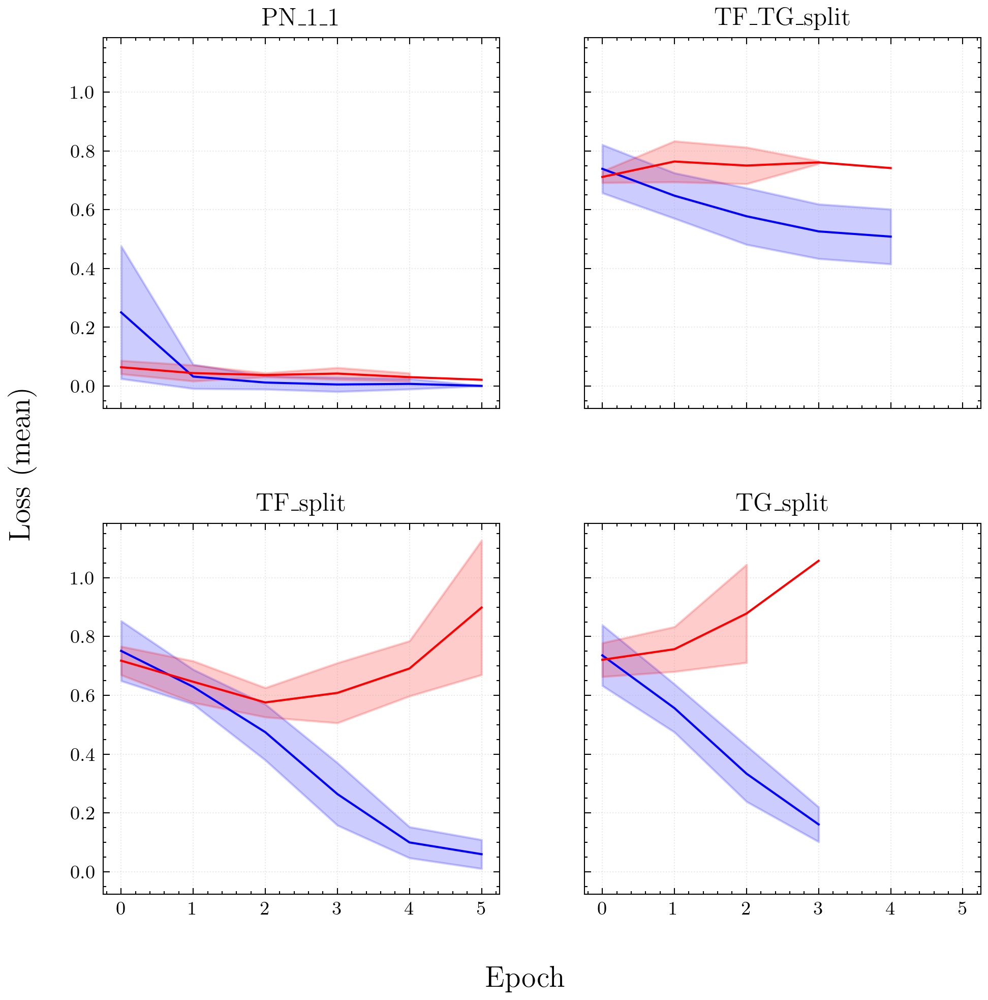

In [301]:
loss_plot(train, val, ["COMBI"])
plt.savefig(combo_rand.joinpath("loss_plot.png"), dpi=400, bbox_inches="tight")

In [302]:
def acc_plot(val):
    fig, axs = plt.subplots(2, 2, figsize=(3.54*2, 3.54*2), sharex=True, sharey=True)
    row_names = ["PN_1_1", "TF_TG_split", "TF_split", "TG_split"]
    print(row_names)

    row_i = 0
    for i, (name, frame) in enumerate(val.groupby(["Dataset"])):
        j = i % 2
        if j == 0 and i > 0:
            row_i += 1 
        ax = axs[row_i, j]
        val_mean = frame.groupby("Epoch").Accuracy.mean().to_numpy()
        val_std = frame.groupby("Epoch").Accuracy.std().to_numpy()
        shaded_line(val_mean, val_std, "g", ax, "Val")
        axs[row_i, j].set_title(name[0])
        print(row_i, j, name)
        
    # add_headers(fig, row_headers=row_names, col_headers=col_names)
    fig.tight_layout(pad=4)
    fig.supxlabel("Epoch", fontsize=14)
    fig.supylabel("Accuracy (mean)", fontsize=14)

['PN_1_1', 'TF_TG_split', 'TF_split', 'TG_split']
0 0 ('PN_1_1',)
0 1 ('TF_TG_split',)
1 0 ('TF_split',)
1 1 ('TG_split',)


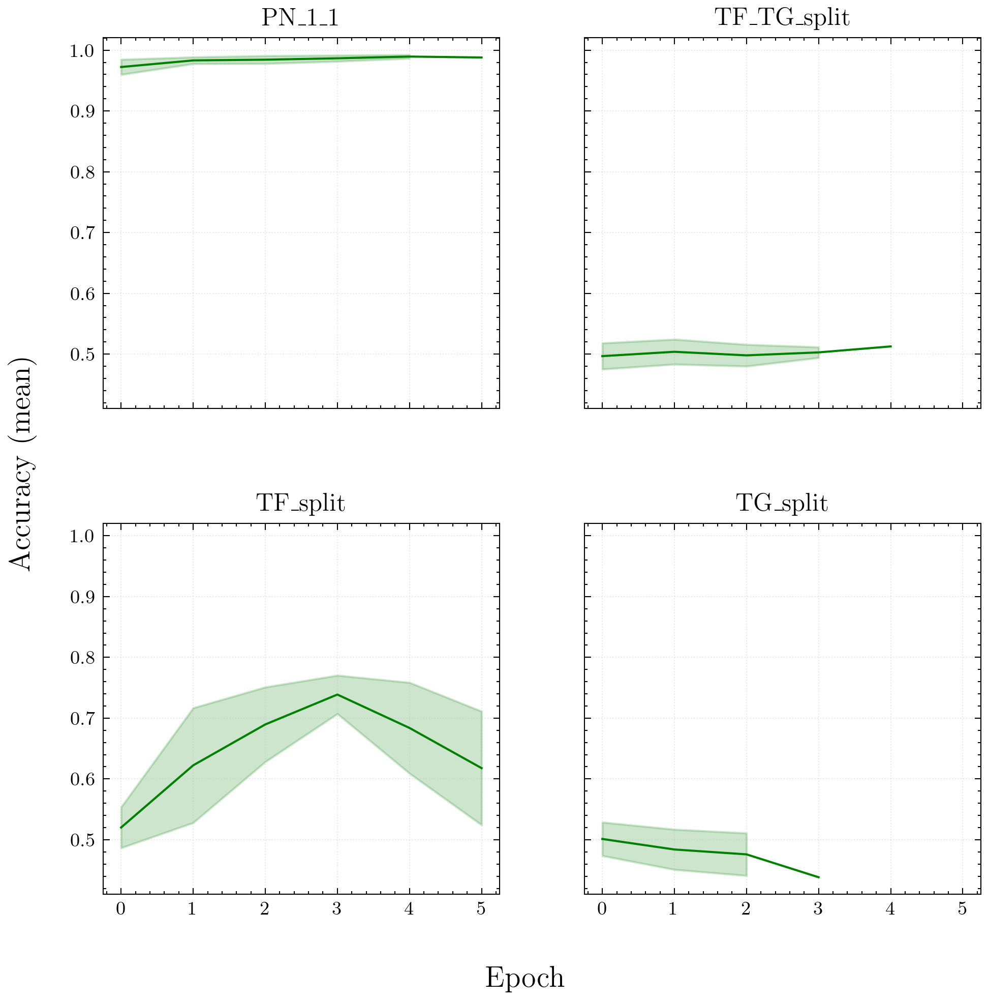

In [303]:
acc_plot(val)
plt.savefig(combo_rand.joinpath("accuracy.png"), dpi=400, bbox_inches="tight")

In [304]:
def auc_scores(test_df):
    roc_scores = defaultdict(list)
    prc_scores = defaultdict(list)

    for name, frame in test.groupby(["Dataset", "Model", "Run"]):
        name = name[:2]
        #frame["pred_label"] = (frame.Pred >= 0.5).astype(int)
        roc_scores[name].append(metric.roc_auc_score(frame.Label, frame.Pred))

        precision, recall, _ = metric.precision_recall_curve(frame.Label, frame.Pred)

        prc_scores[name].append(metric.auc(recall, precision))
    return roc_scores, prc_scores

In [305]:
roc, prc = auc_scores(test)
roc_df = pd.DataFrame(roc).melt()
prc_df = pd.DataFrame(prc).melt()


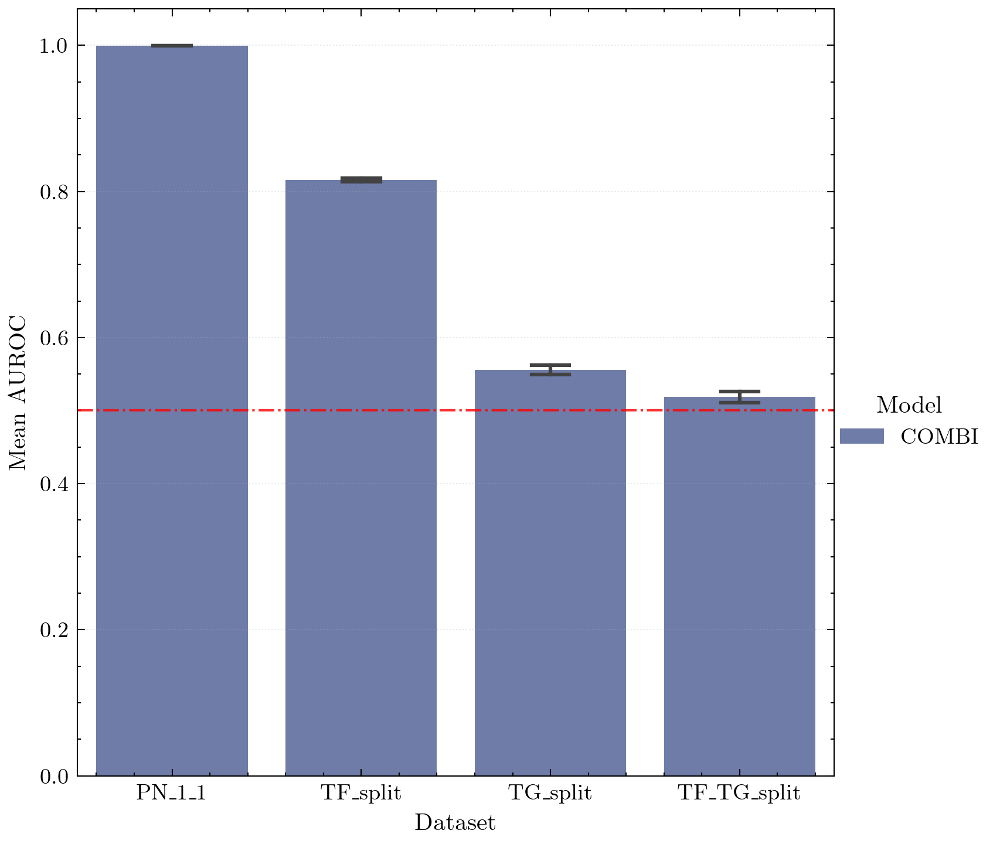

In [306]:
grouped_bar(roc_df)
plt.savefig(combo_rand.joinpath("mean_AUROC.png"), dpi=400, bbox_inches="tight")

In [307]:
performance_report(test)

,,Precision,Recall,F1-score,Accuracy
PN_1_1,COMBI,0.986588,0.998695,0.992604,0.993083
TF_split,COMBI,0.654950,0.721290,0.686521,0.670645
TG_split,COMBI,0.538803,0.383281,0.447926,0.527603
TF_TG_split,COMBI,0.499007,0.633613,0.558312,0.498739


# Triple embedding (addition)

In [308]:
combo = Path("/home/llan/Desktop/WUR/thesis2/media2/binary/triple_embedding/addition")
train = pd.read_table(combo.joinpath(ftrain), index_col=0)
val = pd.read_table(combo.joinpath(fval), index_col=0)
test = pd.read_table(combo.joinpath(ftest), index_col=0)

['PN_1_1', 'TF_TG_split', 'TF_split', 'TG_split']
0 0 ('PN_1_1',)
0 1 ('TF_TG_split',)
1 0 ('TF_split',)
1 1 ('TG_split',)


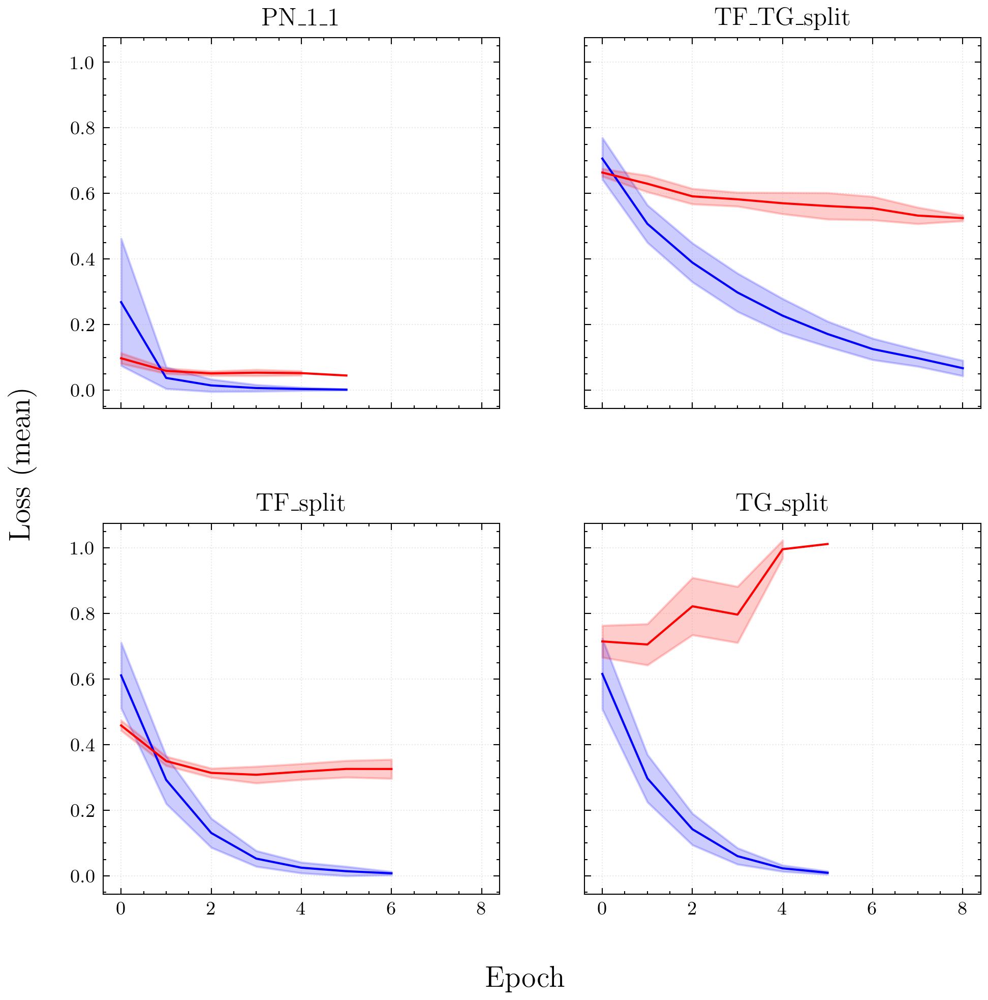

In [309]:
loss_plot(train, val, ["COMBI"])
plt.savefig(combo.joinpath("loss_plot.png"), dpi=400, bbox_inches="tight")

['PN_1_1', 'TF_TG_split', 'TF_split', 'TG_split']
0 0 ('PN_1_1',)
0 1 ('TF_TG_split',)
1 0 ('TF_split',)
1 1 ('TG_split',)


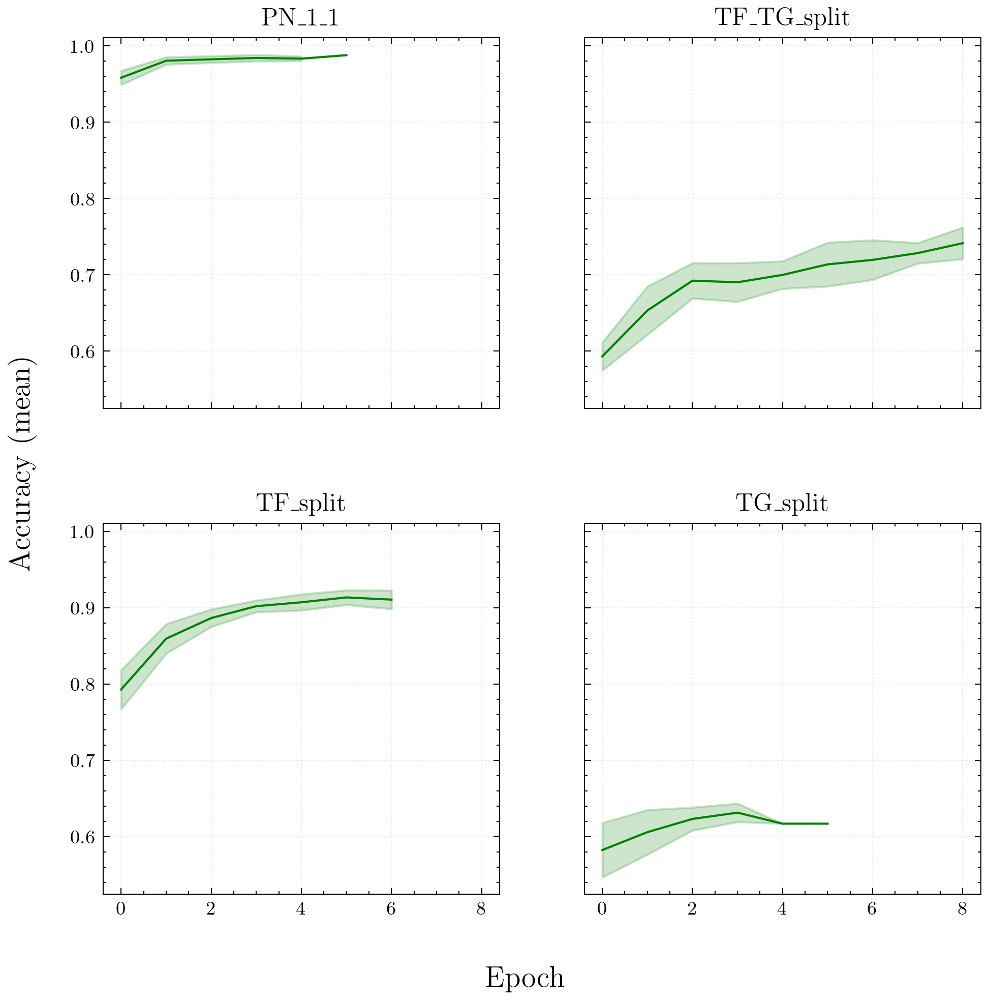

In [310]:
acc_plot(val)
plt.savefig(combo.joinpath("accuracy.png"), dpi=400, bbox_inches="tight")

In [311]:
roc, prc = auc_scores(test)
roc_df = pd.DataFrame(roc).melt()
prc_df = pd.DataFrame(prc).melt()


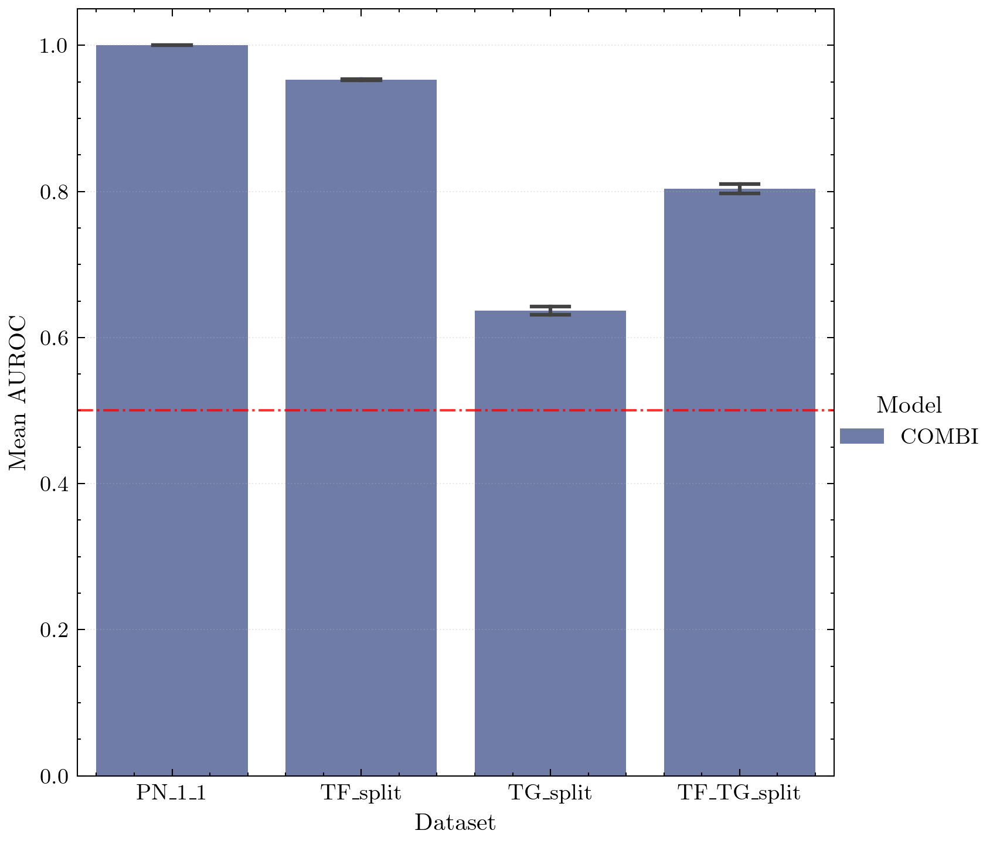

In [312]:
grouped_bar(roc_df)
plt.savefig(combo.joinpath("mean_AUROC.png"), dpi=400, bbox_inches="tight")

In [313]:
performance_report(test)

,,Precision,Recall,F1-score,Accuracy
PN_1_1,COMBI,0.991927,0.994517,0.993220,0.993689
TF_split,COMBI,0.921664,0.857742,0.888555,0.892419
TG_split,COMBI,0.553658,0.828391,0.663718,0.580284
TF_TG_split,COMBI,0.691415,0.751261,0.720097,0.707983


In [216]:
train

,Dataset,Model,Run,Epoch,Batch,Loss
0,PN_1_1,COMBI,0,0,0,0.790052
1,PN_1_1,COMBI,0,0,1,0.623872
2,PN_1_1,COMBI,0,0,2,0.592760
3,PN_1_1,COMBI,0,0,3,0.515018
4,PN_1_1,COMBI,0,0,4,0.529931
...,...,...,...,...,...,...
6843,TG_split,COMBI,9,4,27,0.019547
6844,TG_split,COMBI,9,4,28,0.016946
6845,TG_split,COMBI,9,4,29,0.019278
6846,TG_split,COMBI,9,4,30,0.055036
